## 1. Reading Data File

In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt 
%matplotlib inline

plt.rcParams.update({'font.size': 18})
data_location = '../generated_data/combined_fight_data.csv'

data = pd.read_csv(data_location)
data.head()

,R_fighter,B_fighter,Referee,date,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,...,R_age,location_elevation,end_method,end_how,end_round,city,country,attendance,R_home_elevation,B_home_elevation
0,gerard gordeau,kevin rosier,Joao Alberto Barreto,1993-11-12,Red,False,Open Weight,1,0.0,1.0,...,34.0,1734.0,tko,corner stoppage,NaN,denver,usa,7800.0,10.0,146.0
1,royce gracie,ken shamrock,Joao Alberto Barreto,1993-11-12,Red,False,Open Weight,1,0.0,1.0,...,26.0,1734.0,submission,sleeve choke,NaN,denver,usa,7800.0,270.0,13730.0
2,jason delucia,trent jenkins,Joao Alberto Barreto,1993-11-12,Red,False,Open Weight,1,0.0,0.0,...,24.0,1734.0,submission,rearnaked choke,NaN,denver,usa,7800.0,890.0,NaN
3,royce gracie,gerard gordeau,Joao Alberto Barreto,1993-11-12,Red,True,Catch Weight,1,0.0,2.0,...,26.0,1734.0,submission,rear naked choke,NaN,denver,usa,7800.0,270.0,10.0
4,gerard gordeau,teila tuli,Joao Alberto Barreto,1993-11-12,Red,False,Open Weight,1,0.0,0.0,...,34.0,1734.0,tko,head kick,NaN,denver,usa,7800.0,10.0,60.0


## 2. Basic Data Stats

In [2]:
data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5062 entries, 0 to 5061
Data columns (total 153 columns):
R_fighter                       5062 non-null object
B_fighter                       5062 non-null object
Referee                         5040 non-null object
date                            5062 non-null object
Winner                          5062 non-null object
title_bout                      5062 non-null bool
weight_class                    5062 non-null object
no_of_rounds                    5062 non-null int64
B_current_lose_streak           5062 non-null float64
B_current_win_streak            5062 non-null float64
B_draw                          5062 non-null float64
B_avg_BODY_att                  3821 non-null float64
B_avg_BODY_landed               3821 non-null float64
B_avg_CLINCH_att                3821 non-null float64
B_avg_CLINCH_landed             3821 non-null float64
B_avg_DISTANCE_att              3821 non-null float64
B_avg_DISTANCE_landed           3821 no

In [3]:
data.describe()

,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,...,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,location_elevation,end_round,attendance,R_home_elevation,B_home_elevation
count,5062.000000,5062.000000,5062.000000,5062.0,3821.000000,3821.000000,3821.000000,3821.000000,3821.000000,3821.000000,...,5058.000000,4752.000000,5059.000000,4891.000000,4999.000000,5062.000000,4877.000000,4859.000000,4161.000000,3891.000000
mean,3.119320,0.430067,0.833070,0.0,8.670957,6.072546,8.235402,5.552717,53.115895,19.314951,...,179.294472,183.682837,172.077881,29.175833,29.427085,350.388402,2.344474,11304.609590,4391.865898,4762.515292
std,0.631444,0.730235,1.284469,0.0,7.085757,5.066864,7.595449,5.441859,41.275901,15.967391,...,8.651061,10.309217,35.165213,4.078995,4.140277,404.398067,1.019024,5889.630832,14953.753606,20205.279157
min,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,152.400000,152.400000,115.000000,18.000000,19.000000,0.000000,1.000000,606.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.0,3.500000,2.333333,3.000000,2.000000,22.000000,7.666667,...,172.720000,177.800000,145.000000,26.000000,26.000000,34.000000,1.000000,7760.000000,200.000000,200.000000
50%,3.000000,0.000000,0.000000,0.0,7.000000,5.000000,6.333333,4.200000,44.666667,15.200000,...,180.340000,185.420000,170.000000,29.000000,29.000000,188.000000,3.000000,10787.000000,1460.000000,1460.000000
75%,3.000000,1.000000,1.000000,0.0,12.090909,8.461538,11.400000,7.681818,74.250000,27.083333,...,185.420000,190.500000,185.000000,32.000000,32.000000,610.000000,3.000000,14666.000000,5120.000000,3660.000000
max,5.000000,6.000000,12.000000,0.0,49.000000,39.000000,87.000000,68.000000,271.000000,130.000000,...,210.820000,213.360000,345.000000,51.000000,47.000000,2240.000000,5.000000,56214.000000,377952.000000,377952.000000


## 3. Exploring Categorical Columns

### 3.1 Weight Class

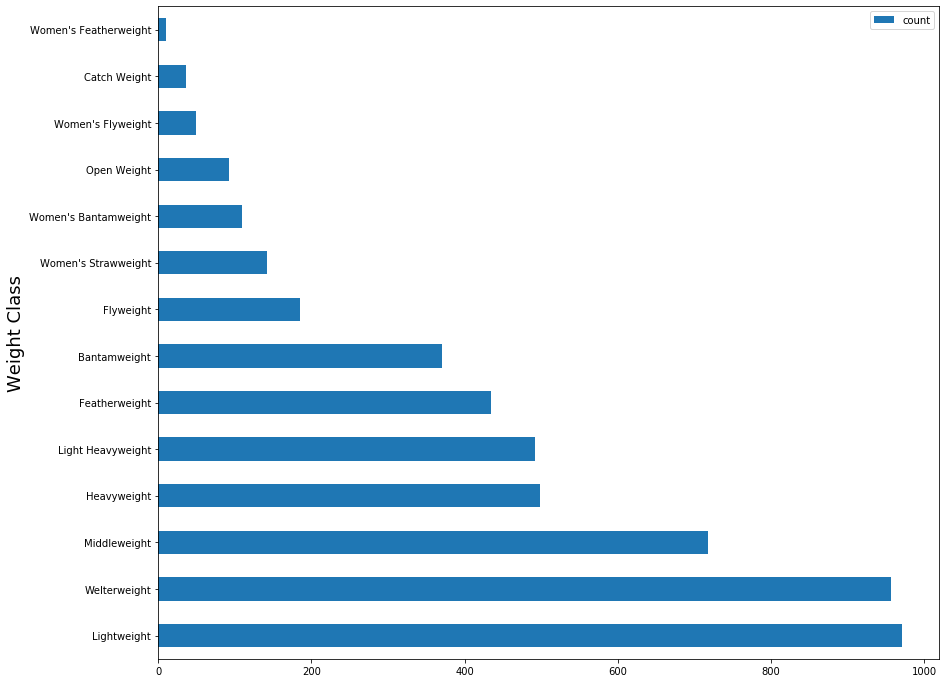

In [4]:
weight_class = pd.DataFrame(data['weight_class'].value_counts())
weight_class.reset_index(inplace=True)
weight_class.columns = ['weight_class', 'count']
weight_class.set_index('weight_class',inplace=True)
weight_class.plot.barh(figsize=(14, 12)).set_ylabel('Weight Class', fontsize=18)
plt.show()

### 3.2 Fighter Stance

Text(0, 0.5, 'Red Fighter Stance')

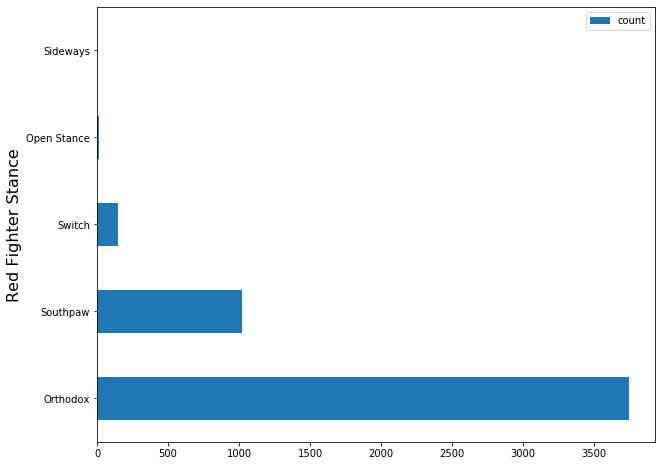

In [5]:
# red fighter stance
R_Stance = pd.DataFrame(data['R_Stance'].value_counts())
R_Stance.reset_index(inplace=True)
R_Stance.columns = ['R_Stance', 'count']
R_Stance.set_index('R_Stance',inplace=True)
R_Stance.plot.barh(figsize=(10, 8)).set_ylabel('Red Fighter Stance', fontsize=16)

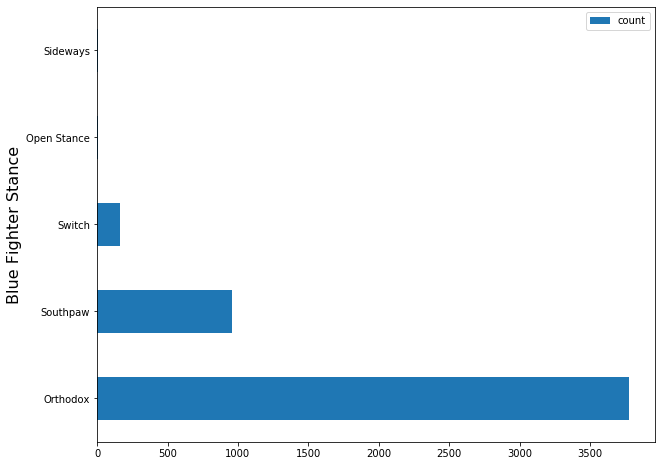

In [6]:
# Blue fighter stance
B_Stance = pd.DataFrame(data['B_Stance'].value_counts())
B_Stance.reset_index(inplace=True)
B_Stance.columns = ['B_Stance', 'count']
B_Stance.set_index('B_Stance',inplace=True)
plot = B_Stance.plot.barh(figsize=(10, 8)).set_ylabel('Blue Fighter Stance', fontsize=16)

### 3.3 End Method

Text(0, 0.5, 'End Method')

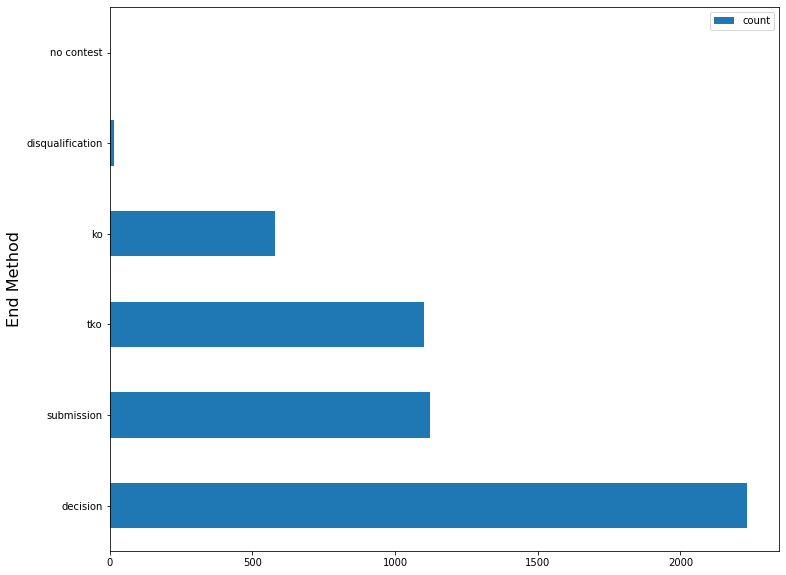

In [7]:
end_method = pd.DataFrame(data['end_method'].value_counts())
end_method.reset_index(inplace=True)
end_method.columns = ['end_method', 'count']
end_method.set_index('end_method',inplace=True)
end_method.plot.barh(figsize=(12, 10)).set_ylabel('End Method', fontsize=16)

### 3.4 End How

In [8]:
data['end_how'].value_counts()

punches                914
30–27, 30–27, 30–27    411
rearnaked choke        381
29–28, 29–28, 29–28    350
guillotine choke       176
                      ... 
29–28, 29–27, 28–27      1
30–26, 30–27, 29–29      1
dislocated shoulder      1
29–26, 29–26, 28–27      1
28–27, 28–27, 29–27      1
Name: end_how, Length: 435, dtype: int64

## 4.  Exploring Target Column Winner

Text(0, 0.5, 'Red Fighter Won')

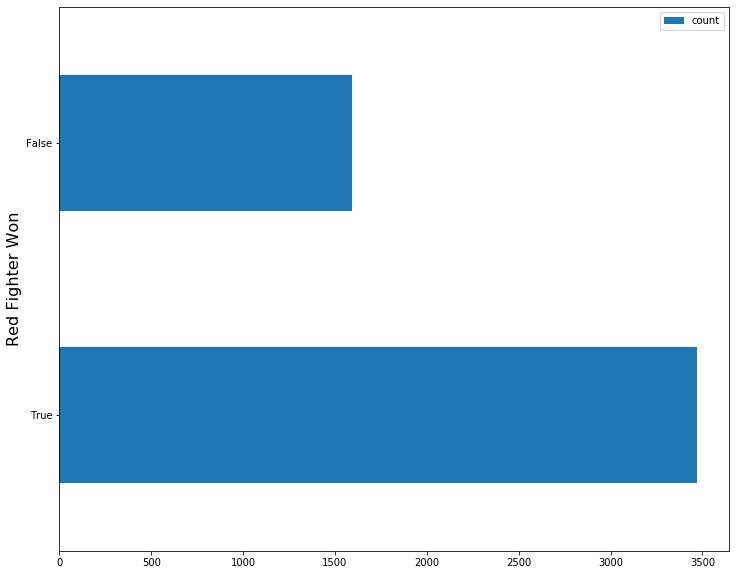

In [9]:
# changing winner label to bool and keeping whether or not Red fighter won
data_copy = data.copy()
data_copy['Winner'] = data_copy['Winner'].apply(lambda x: True if x == 'Red' else False)

winner = pd.DataFrame(data_copy['Winner'].value_counts())
winner.reset_index(inplace=True)
winner.columns = ['Winner', 'count']
winner.set_index('Winner',inplace=True)
winner.plot.barh(figsize=(12, 10)).set_ylabel('Red Fighter Won', fontsize=16)

# Explore Null values and feature correlations

In [10]:
import re
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt 
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 18})

def import_and_merge():
    fight_data = pd.read_csv(data_location)
    
    #Add Blue and Red win columns
    fight_data['B_Winner'] = [1 if x=='Blue' else 0 for x in fight_data['Winner']]
    fight_data['R_Winner'] = [1 if x=='Red' else 0 for x in fight_data['Winner']]
    
    #Drop columns irrelevant to this prediction
    fight_data = fight_data.drop(columns=['Referee', 'no_of_rounds', 'Winner', 'date', 'end_method', 'end_how', 
                                          'end_round', 'attendance'])
    print('Fight Data Stats: ')
    print('Shape: ', fight_data.shape)
    #display(fight_data)
    
    #Separate fight data into individual fighter stats
    blue_fighters = fight_data.loc[:, [col for col in fight_data.columns if re.search('^R_', col)==None]]
    blue_fighters = blue_fighters.rename(columns=lambda x: re.sub('^B_', '', x))
    print('\nBlue fighter Stats: ')
    print('Shape: ', blue_fighters.shape)
    #display(blue_fighters)
    
    red_fighters = fight_data.loc[:, [col for col in fight_data.columns if re.search('^B_', col)==None]]
    red_fighters = red_fighters.rename(columns=lambda x: re.sub('^R_', '', x))
    print('\nRed fighter Stats: ')
    print('Shape: ', red_fighters.shape)
    #display(red_fighters)
    
    #Concatenate blue and red fighter stats
    fighters_data = pd.concat([blue_fighters, red_fighters])
    fighters_data = fighters_data.rename(columns={'total_time_fought(seconds)':'total_time_fought_seconds'})
    print('\nTotal fighter Stats: ')
    print('Shape: ', fighters_data.shape)
    
    # Create df without offence stats
    fighters_no_offence_stats = fighters_data.drop(columns=[col for col in fighters_data.columns if re.search('^avg_', col) != None])
    fighters_no_offence_stats = fighters_no_offence_stats.drop(columns='total_time_fought_seconds')
    print('\nFighters no offensive stats: ')
    print('Shape: ', fighters_no_offence_stats.shape)
    
    return (fighters_no_offence_stats, fighters_data)
    
data_no_offence_stats, data  = import_and_merge()

Fight Data Stats: 
Shape:  (5062, 147)

Blue fighter Stats: 
Shape:  (5062, 76)

Red fighter Stats: 
Shape:  (5062, 76)

Total fighter Stats: 
Shape:  (10124, 76)

Fighters no offensive stats: 
Shape:  (10124, 27)


Shape:  (10124, 76)


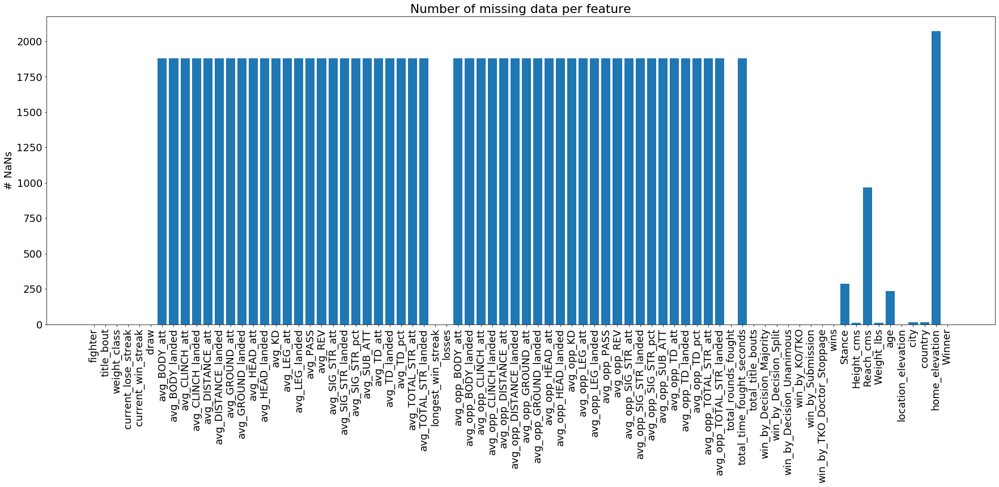

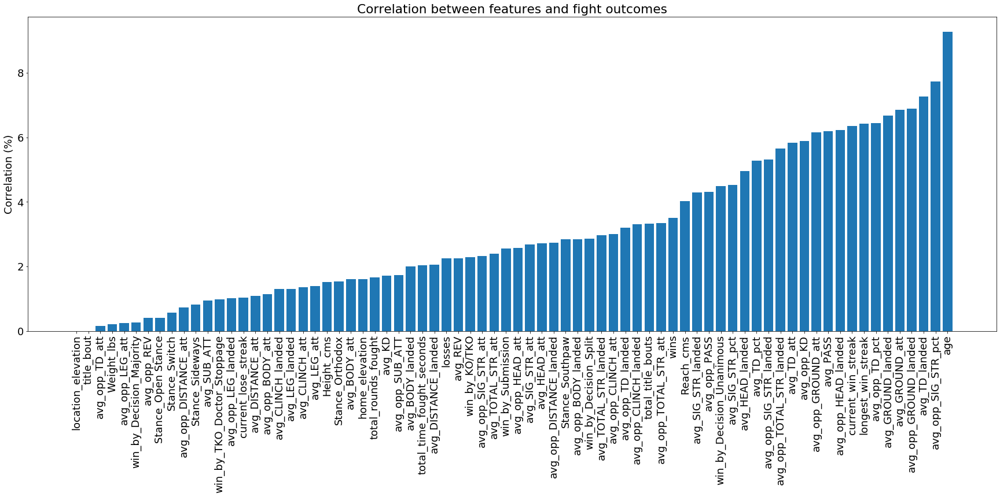

In [11]:
def plot_correlation(df):
    df = df.drop(columns=['fighter','city', 'country', 'weight_class'])
    dummy_df = pd.get_dummies(df)

    corr = dummy_df.corr()['Winner'][:]
    corr = corr.drop(['Winner']) * 100
    corr = corr.loc[~pd.isnull(corr)]
    corr = abs(corr).sort_values()
    
    fig = plt.figure(figsize=(30, 10))
    ax = plt.axes()
    ax.bar(corr.index, corr)
    plt.xticks(rotation='vertical')
    plt.ylabel('Correlation (%)')
    plt.title('Correlation between features and fight outcomes')
    
    most_corr_features = corr.index[-int(len(corr)/2):]
    return most_corr_features

def plot_missing_vals(df):
    columns = []
    nans_per_col = []
    
    for col in df.columns:
        num_nans = sum(pd.isnull(df[col]))
        #print('Num of NaNs in col ', col, ': ', num_nans)
        columns.append(col)
        nans_per_col.append(num_nans)
    
    print('Shape: ', df.shape)
    fig = plt.figure(figsize=(30, 10))
    ax = plt.axes()
    ax.bar(columns, nans_per_col)
    plt.xticks(rotation='vertical')
    plt.ylabel('# NaNs')
    plt.title('Number of missing data per feature')

plot_missing_vals(data)
top_features = plot_correlation(data)

# Explore overall distribution (Not split by weight-class)
Explore the box and point plots of all features in the dataset. These plots were then looked at in more detail to draw insights

<Figure size 2160x936 with 0 Axes>

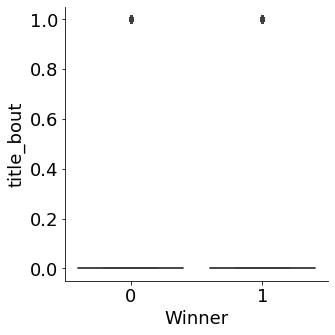

<Figure size 2160x936 with 0 Axes>

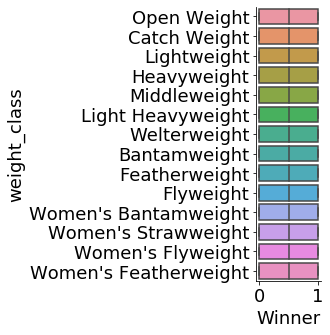

<Figure size 2160x936 with 0 Axes>

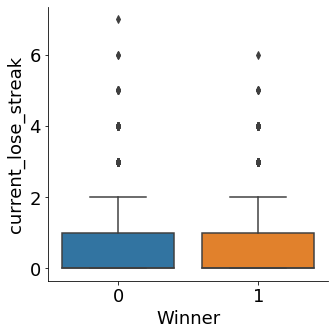

<Figure size 2160x936 with 0 Axes>

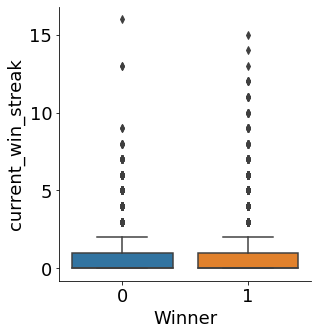

<Figure size 2160x936 with 0 Axes>

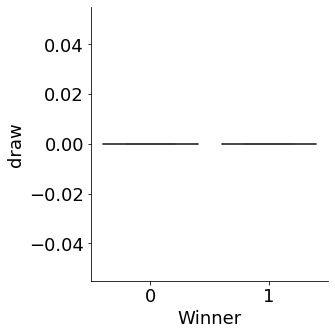

<Figure size 2160x936 with 0 Axes>

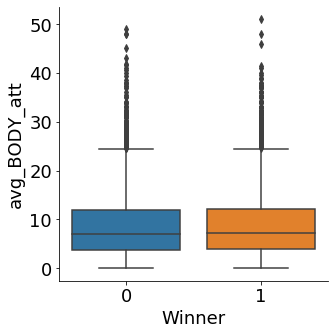

<Figure size 2160x936 with 0 Axes>

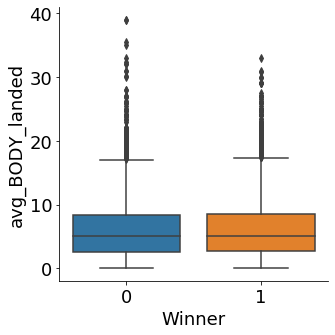

<Figure size 2160x936 with 0 Axes>

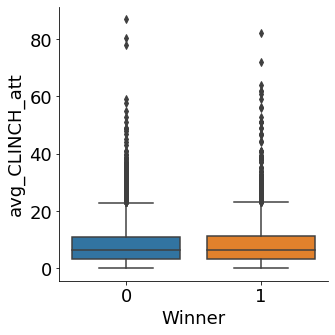

<Figure size 2160x936 with 0 Axes>

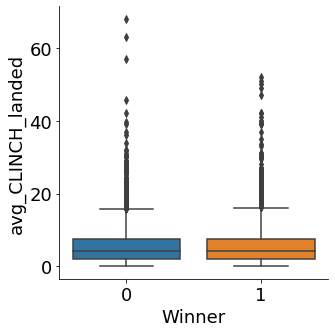

<Figure size 2160x936 with 0 Axes>

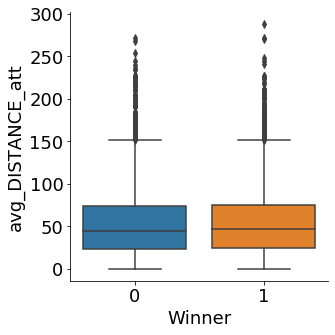

<Figure size 2160x936 with 0 Axes>

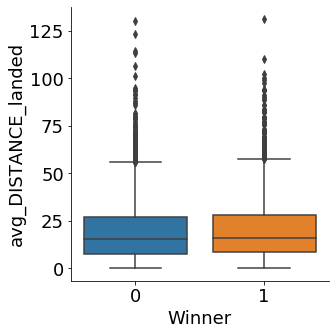

<Figure size 2160x936 with 0 Axes>

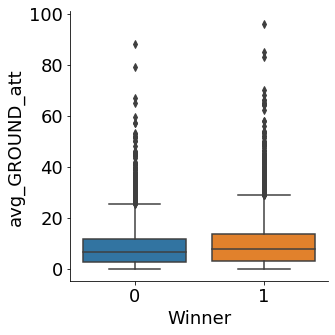

<Figure size 2160x936 with 0 Axes>

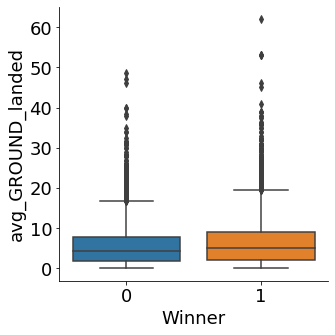

<Figure size 2160x936 with 0 Axes>

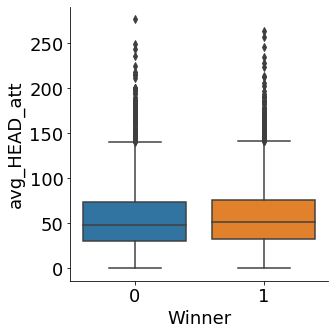

<Figure size 2160x936 with 0 Axes>

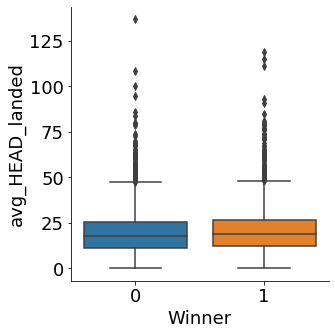

<Figure size 2160x936 with 0 Axes>

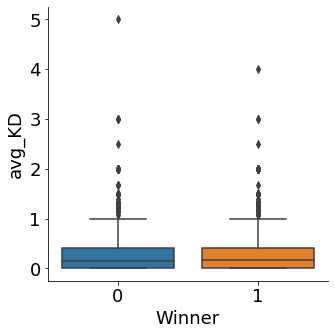

<Figure size 2160x936 with 0 Axes>

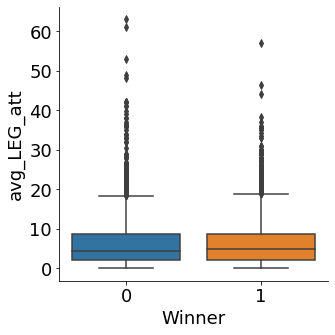

<Figure size 2160x936 with 0 Axes>

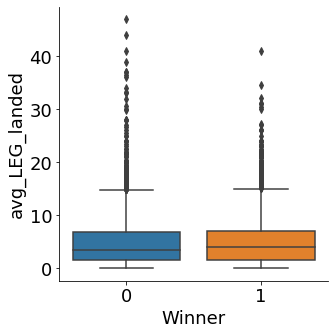

<Figure size 2160x936 with 0 Axes>

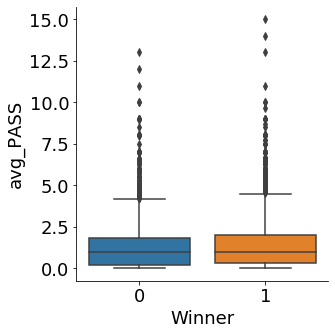

<Figure size 2160x936 with 0 Axes>

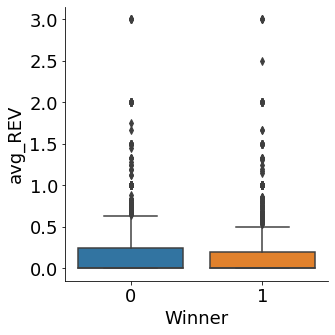

<Figure size 2160x936 with 0 Axes>

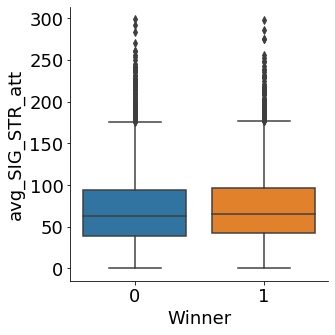

<Figure size 2160x936 with 0 Axes>

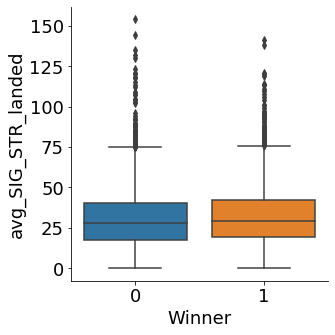

<Figure size 2160x936 with 0 Axes>

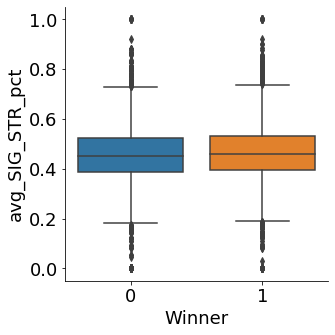

<Figure size 2160x936 with 0 Axes>

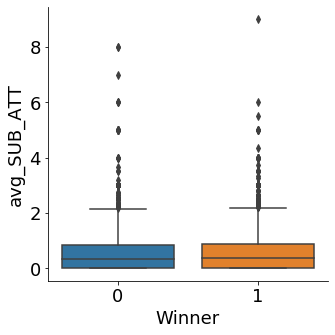

<Figure size 2160x936 with 0 Axes>

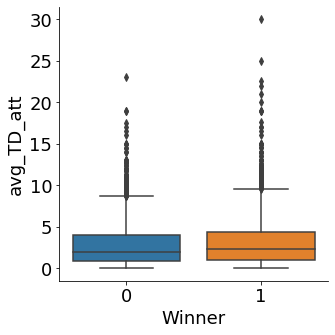

<Figure size 2160x936 with 0 Axes>

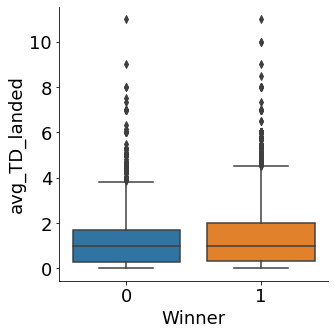

<Figure size 2160x936 with 0 Axes>

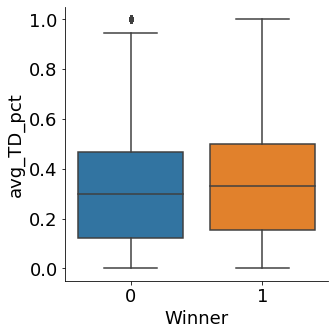

<Figure size 2160x936 with 0 Axes>

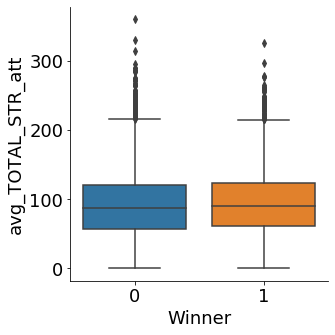

<Figure size 2160x936 with 0 Axes>

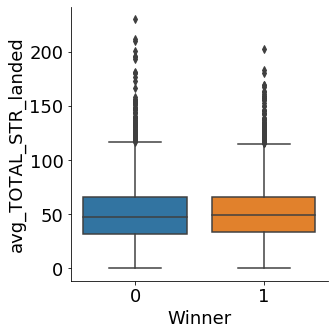

<Figure size 2160x936 with 0 Axes>

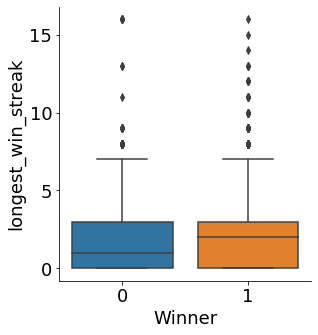

<Figure size 2160x936 with 0 Axes>

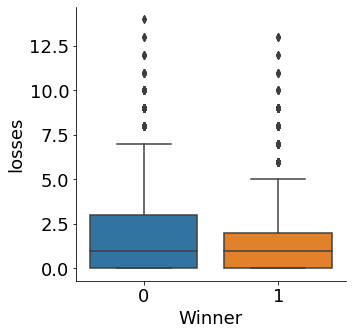

<Figure size 2160x936 with 0 Axes>

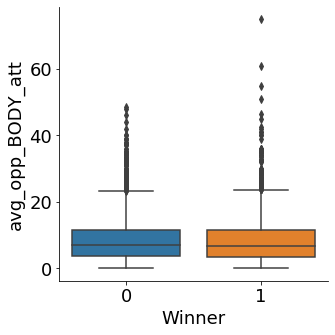

<Figure size 2160x936 with 0 Axes>

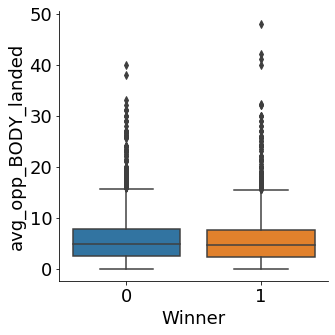

<Figure size 2160x936 with 0 Axes>

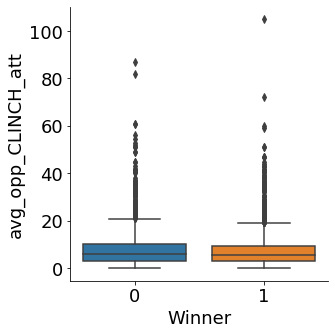

<Figure size 2160x936 with 0 Axes>

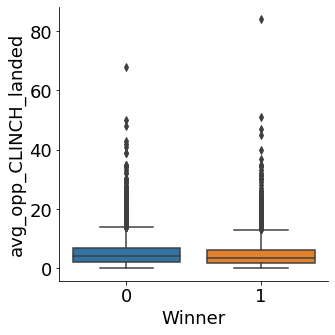

<Figure size 2160x936 with 0 Axes>

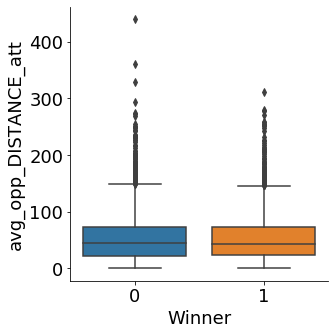

<Figure size 2160x936 with 0 Axes>

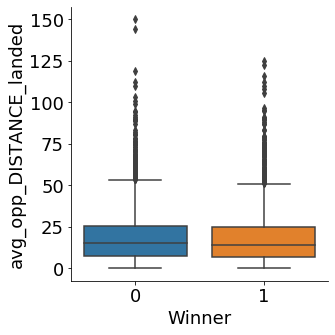

<Figure size 2160x936 with 0 Axes>

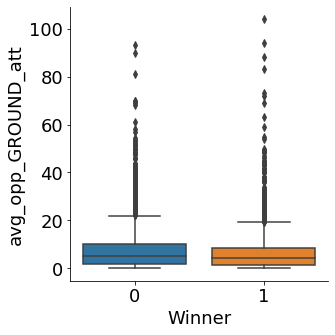

<Figure size 2160x936 with 0 Axes>

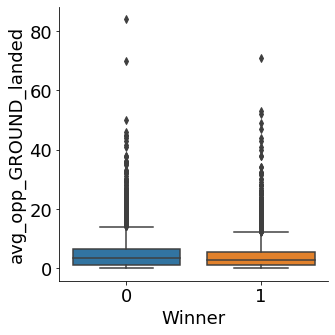

<Figure size 2160x936 with 0 Axes>

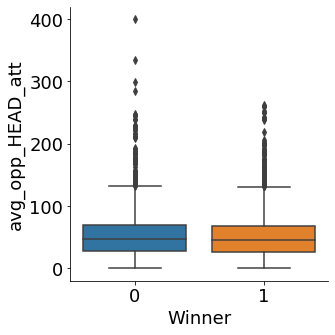

<Figure size 2160x936 with 0 Axes>

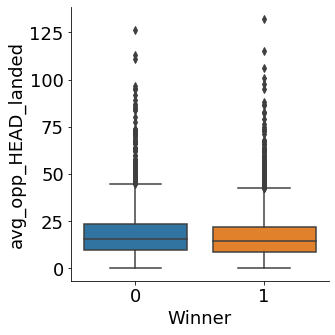

<Figure size 2160x936 with 0 Axes>

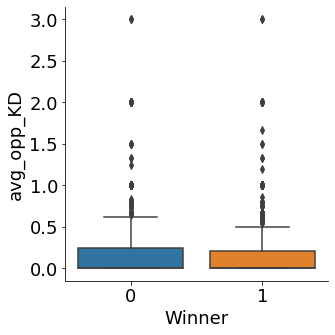

<Figure size 2160x936 with 0 Axes>

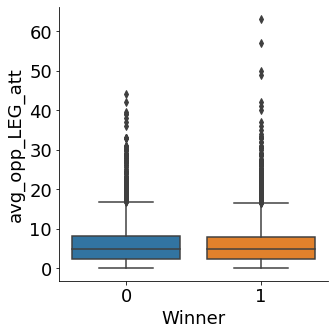

<Figure size 2160x936 with 0 Axes>

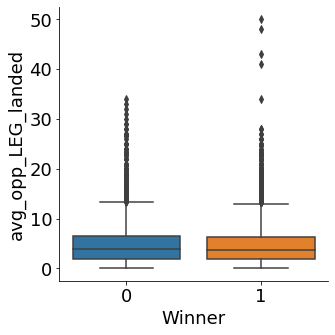

<Figure size 2160x936 with 0 Axes>

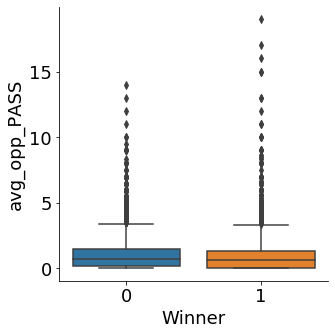

<Figure size 2160x936 with 0 Axes>

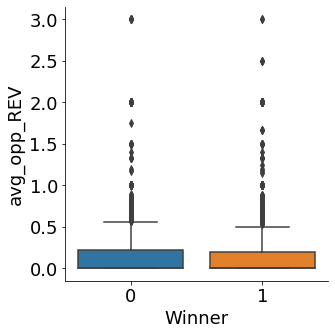

<Figure size 2160x936 with 0 Axes>

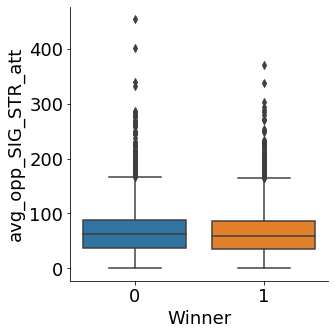

<Figure size 2160x936 with 0 Axes>

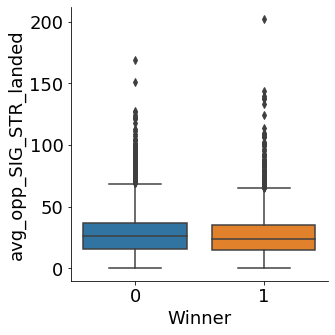

<Figure size 2160x936 with 0 Axes>

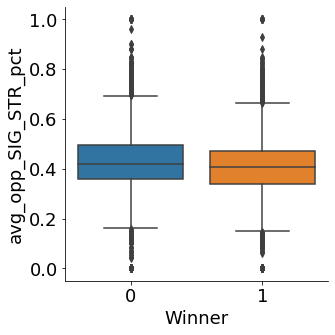

<Figure size 2160x936 with 0 Axes>

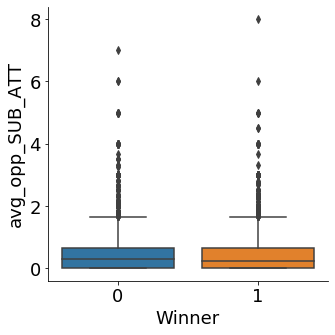

<Figure size 2160x936 with 0 Axes>

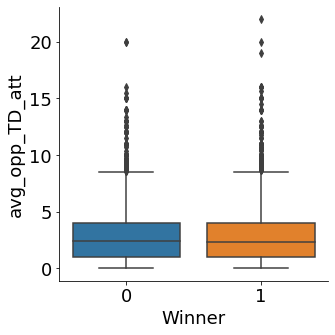

<Figure size 2160x936 with 0 Axes>

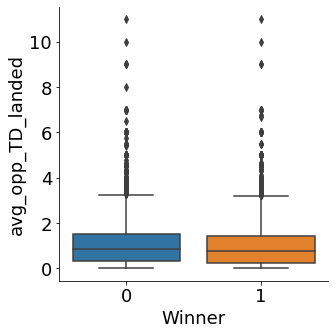

<Figure size 2160x936 with 0 Axes>

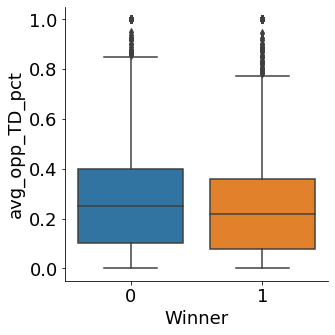

<Figure size 2160x936 with 0 Axes>

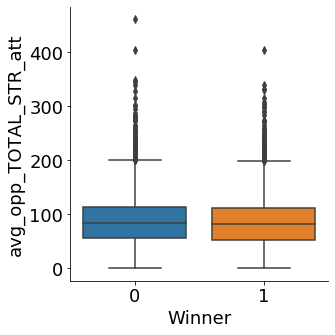

<Figure size 2160x936 with 0 Axes>

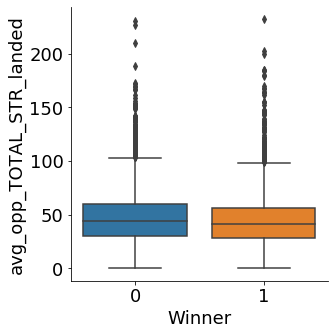

<Figure size 2160x936 with 0 Axes>

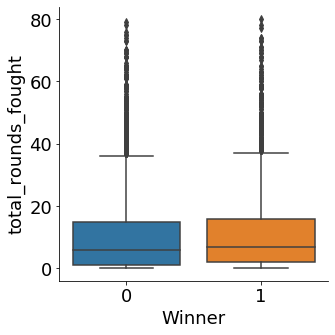

<Figure size 2160x936 with 0 Axes>

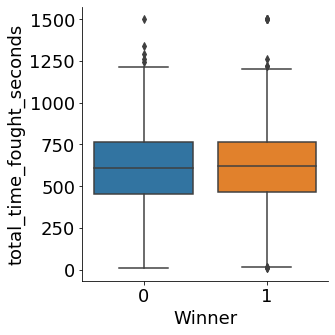

<Figure size 2160x936 with 0 Axes>

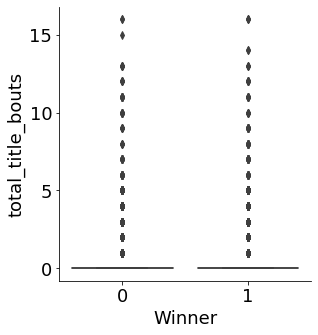

<Figure size 2160x936 with 0 Axes>

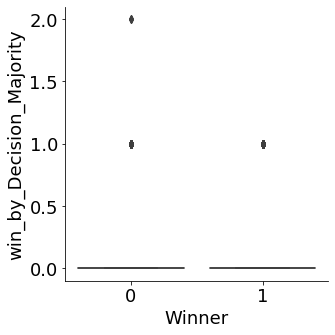

<Figure size 2160x936 with 0 Axes>

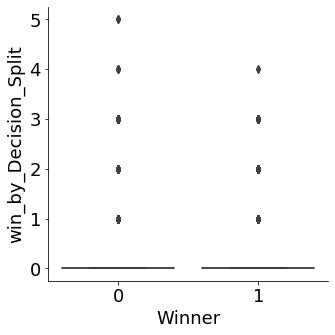

<Figure size 2160x936 with 0 Axes>

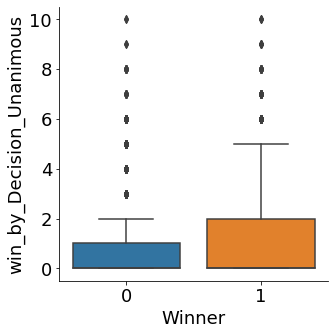

<Figure size 2160x936 with 0 Axes>

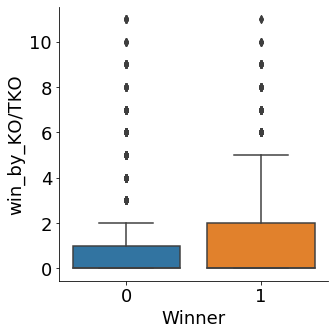

<Figure size 2160x936 with 0 Axes>

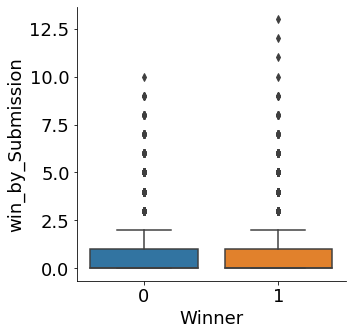

<Figure size 2160x936 with 0 Axes>

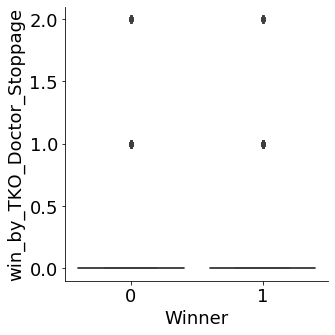

<Figure size 2160x936 with 0 Axes>

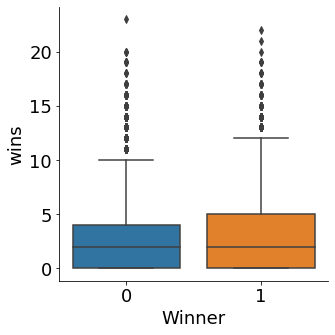

<Figure size 2160x936 with 0 Axes>

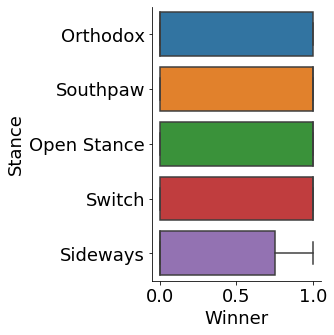

<Figure size 2160x936 with 0 Axes>

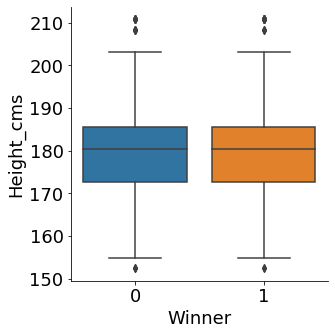

<Figure size 2160x936 with 0 Axes>

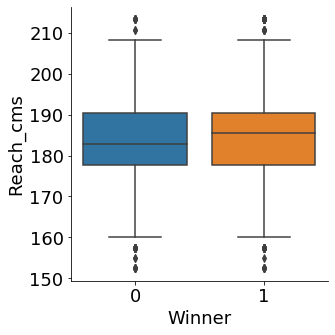

<Figure size 2160x936 with 0 Axes>

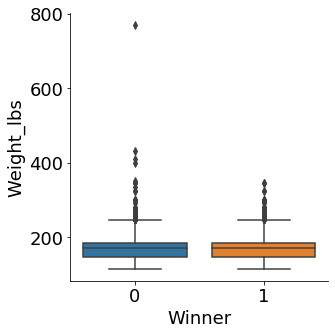

<Figure size 2160x936 with 0 Axes>

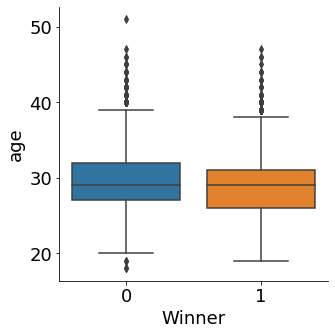

<Figure size 2160x936 with 0 Axes>

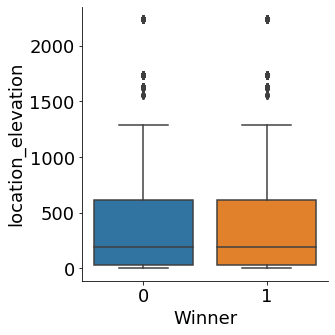

<Figure size 2160x936 with 0 Axes>

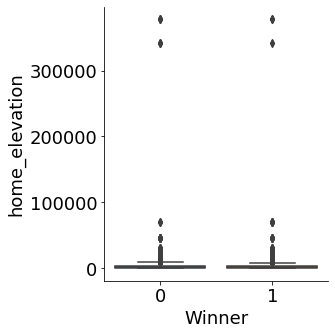

<Figure size 2160x936 with 0 Axes>

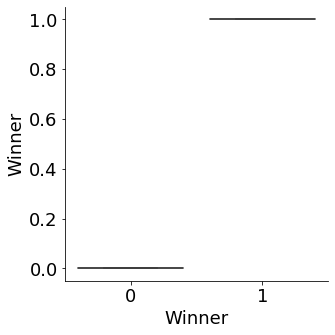

<Figure size 2160x936 with 0 Axes>

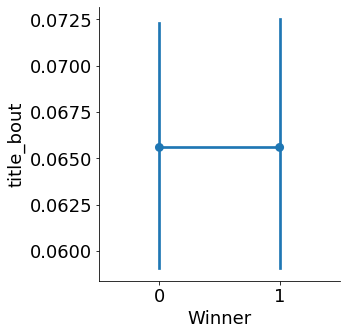

<Figure size 2160x936 with 0 Axes>

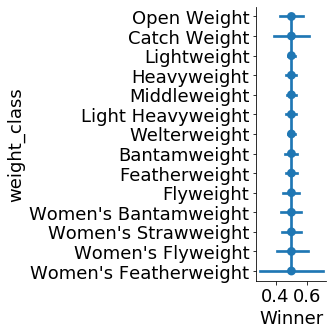

<Figure size 2160x936 with 0 Axes>

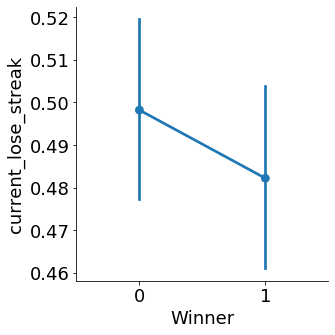

<Figure size 2160x936 with 0 Axes>

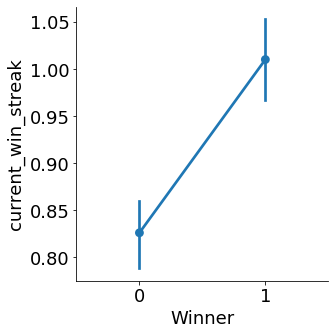

<Figure size 2160x936 with 0 Axes>

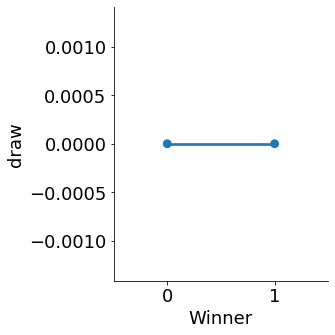

<Figure size 2160x936 with 0 Axes>

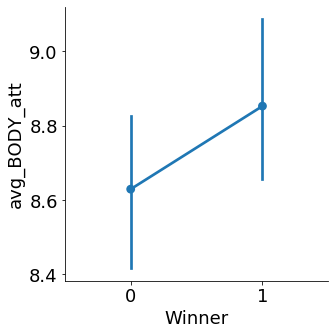

<Figure size 2160x936 with 0 Axes>

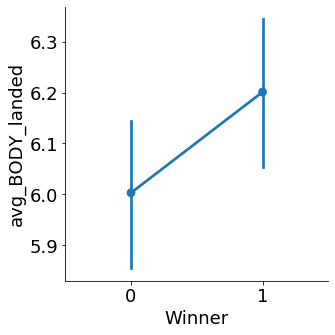

<Figure size 2160x936 with 0 Axes>

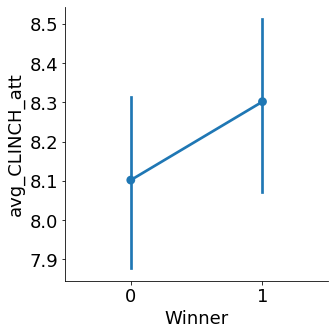

<Figure size 2160x936 with 0 Axes>

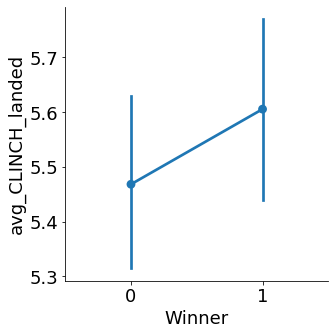

<Figure size 2160x936 with 0 Axes>

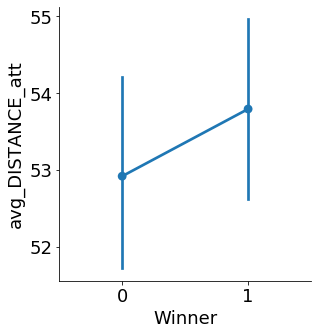

<Figure size 2160x936 with 0 Axes>

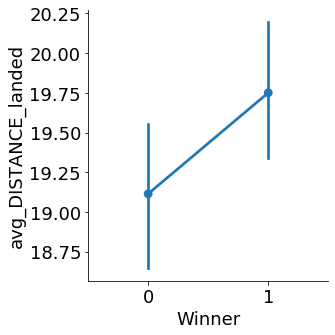

<Figure size 2160x936 with 0 Axes>

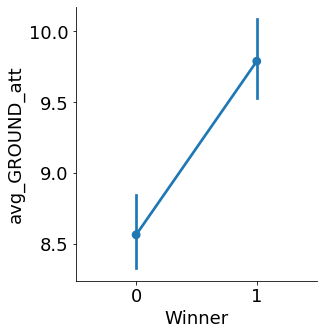

<Figure size 2160x936 with 0 Axes>

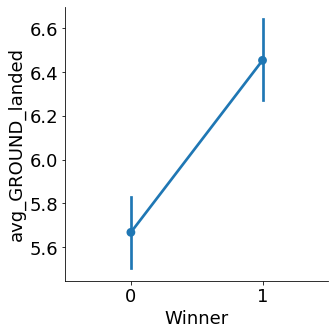

<Figure size 2160x936 with 0 Axes>

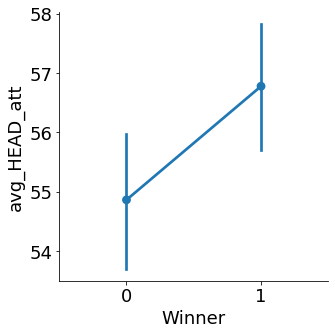

<Figure size 2160x936 with 0 Axes>

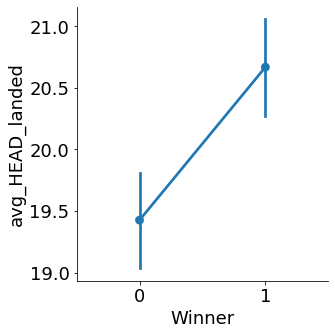

<Figure size 2160x936 with 0 Axes>

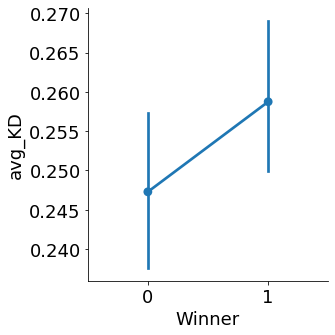

<Figure size 2160x936 with 0 Axes>

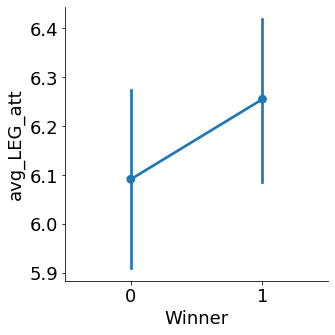

<Figure size 2160x936 with 0 Axes>

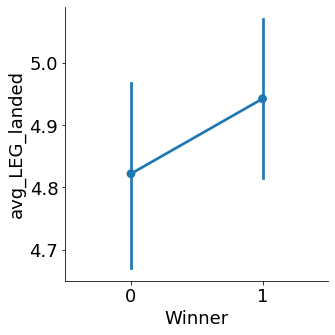

<Figure size 2160x936 with 0 Axes>

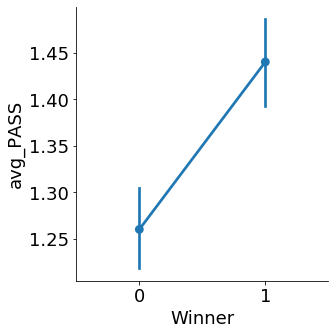

<Figure size 2160x936 with 0 Axes>

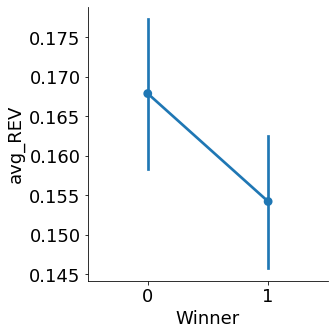

<Figure size 2160x936 with 0 Axes>

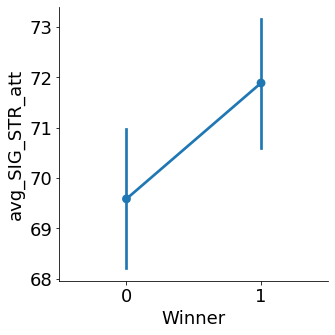

<Figure size 2160x936 with 0 Axes>

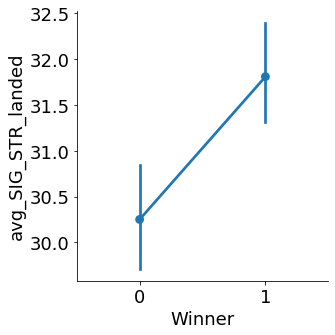

<Figure size 2160x936 with 0 Axes>

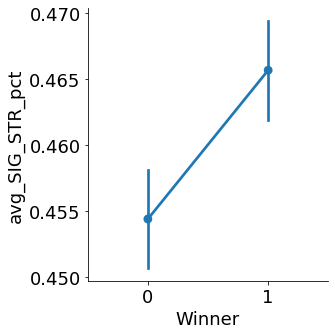

<Figure size 2160x936 with 0 Axes>

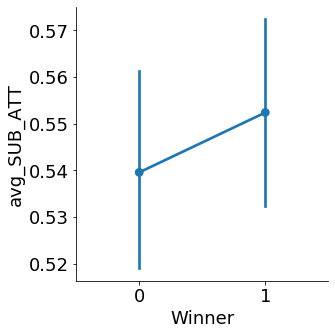

<Figure size 2160x936 with 0 Axes>

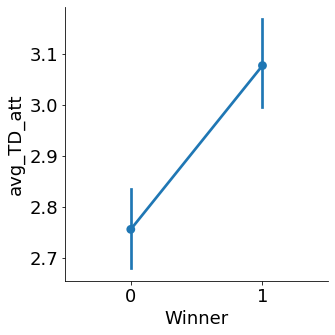

<Figure size 2160x936 with 0 Axes>

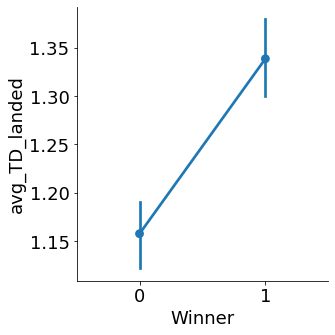

<Figure size 2160x936 with 0 Axes>

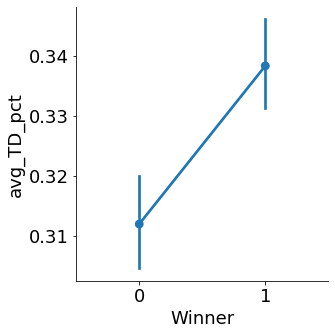

<Figure size 2160x936 with 0 Axes>

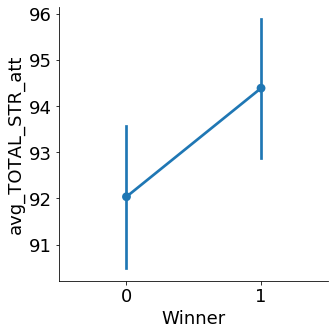

<Figure size 2160x936 with 0 Axes>

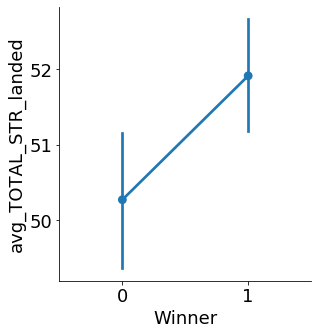

<Figure size 2160x936 with 0 Axes>

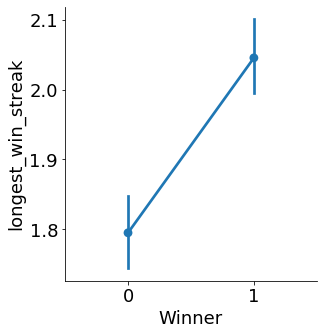

<Figure size 2160x936 with 0 Axes>

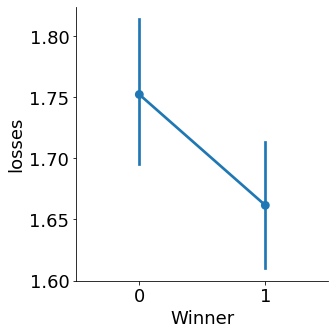

<Figure size 2160x936 with 0 Axes>

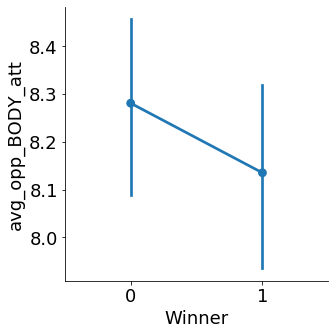

<Figure size 2160x936 with 0 Axes>

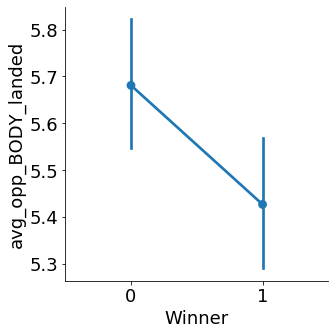

<Figure size 2160x936 with 0 Axes>

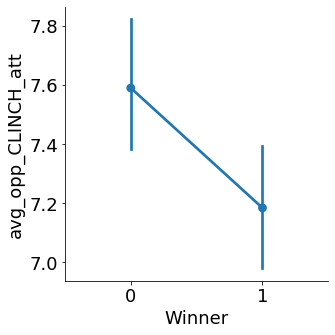

<Figure size 2160x936 with 0 Axes>

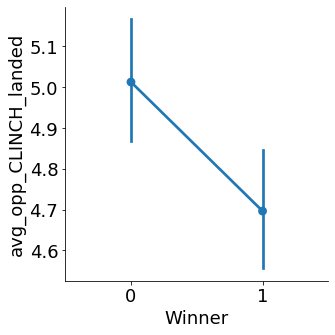

<Figure size 2160x936 with 0 Axes>

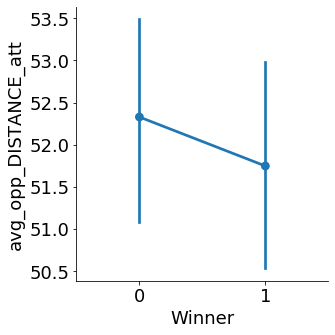

<Figure size 2160x936 with 0 Axes>

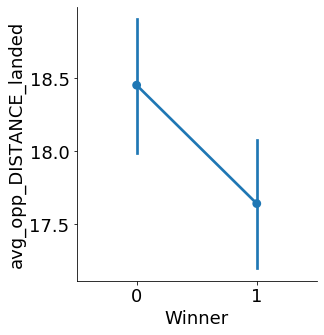

<Figure size 2160x936 with 0 Axes>

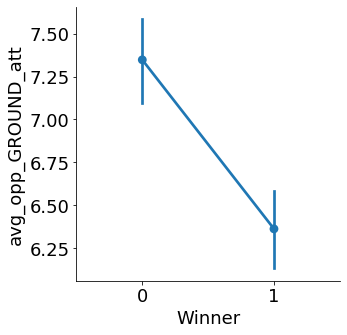

<Figure size 2160x936 with 0 Axes>

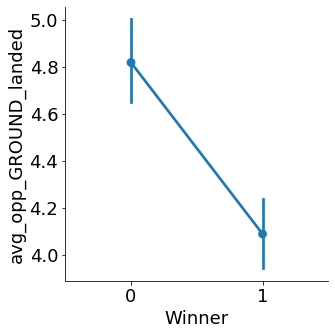

<Figure size 2160x936 with 0 Axes>

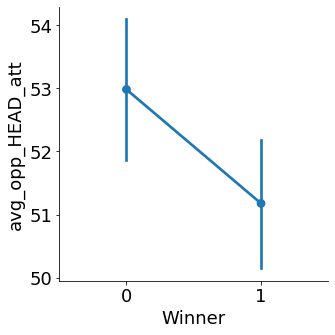

<Figure size 2160x936 with 0 Axes>

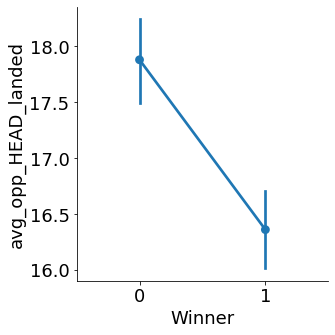

<Figure size 2160x936 with 0 Axes>

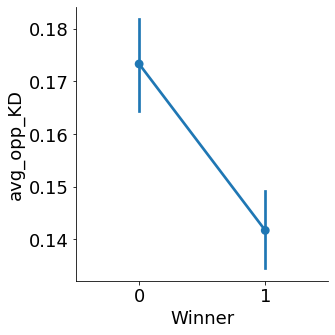

<Figure size 2160x936 with 0 Axes>

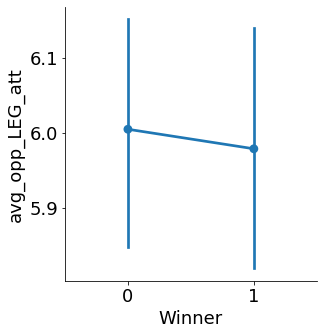

<Figure size 2160x936 with 0 Axes>

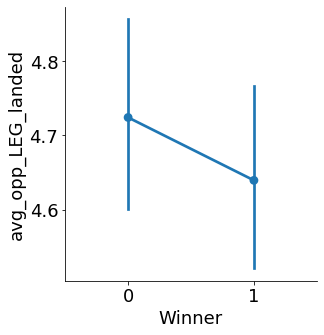

<Figure size 2160x936 with 0 Axes>

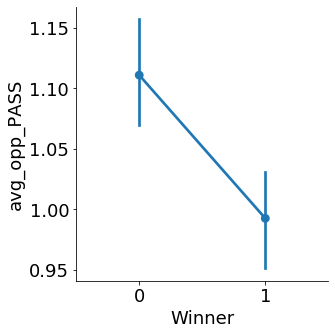

<Figure size 2160x936 with 0 Axes>

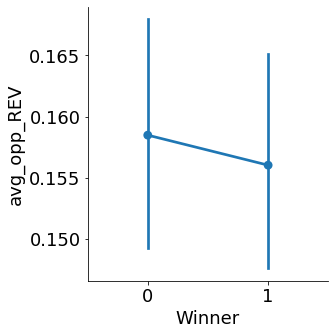

<Figure size 2160x936 with 0 Axes>

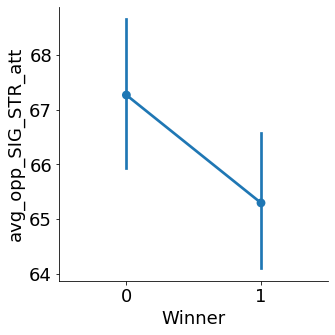

<Figure size 2160x936 with 0 Axes>

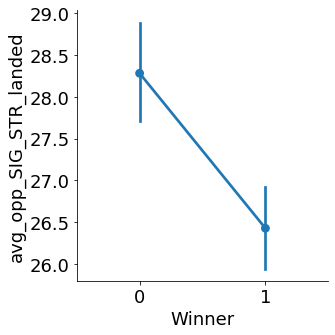

<Figure size 2160x936 with 0 Axes>

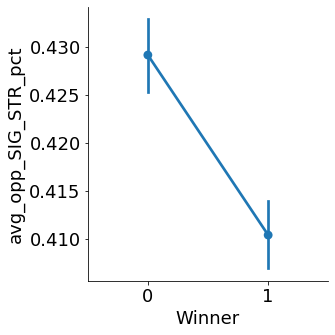

<Figure size 2160x936 with 0 Axes>

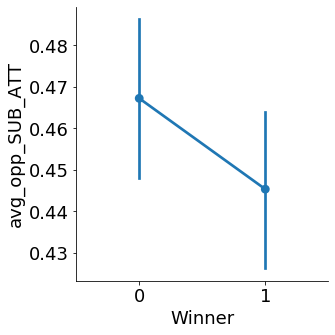

<Figure size 2160x936 with 0 Axes>

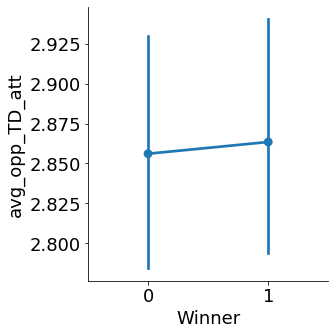

<Figure size 2160x936 with 0 Axes>

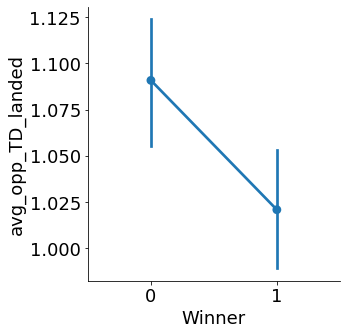

<Figure size 2160x936 with 0 Axes>

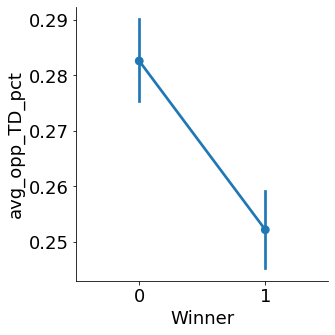

<Figure size 2160x936 with 0 Axes>

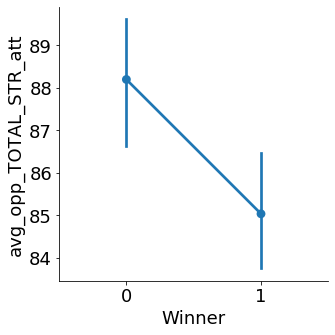

<Figure size 2160x936 with 0 Axes>

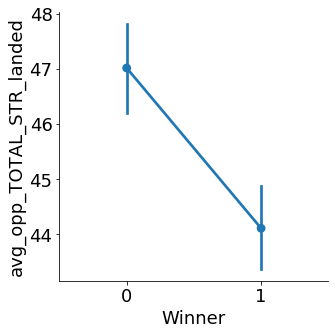

<Figure size 2160x936 with 0 Axes>

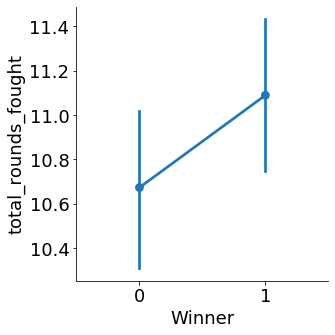

<Figure size 2160x936 with 0 Axes>

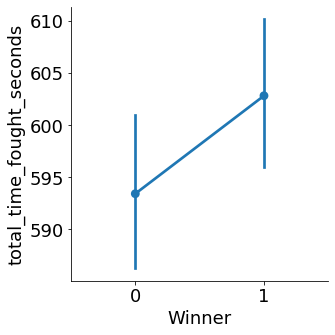

<Figure size 2160x936 with 0 Axes>

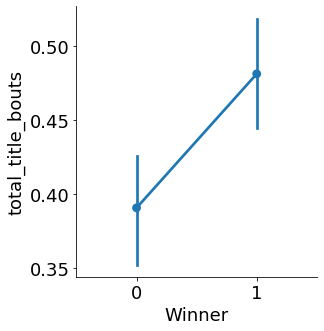

<Figure size 2160x936 with 0 Axes>

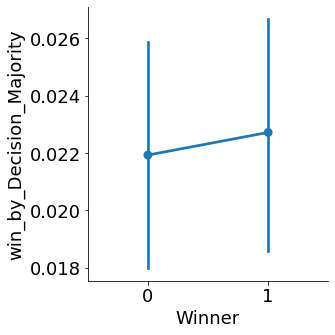

<Figure size 2160x936 with 0 Axes>

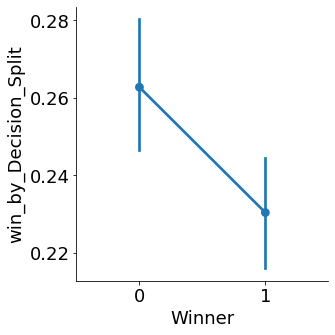

<Figure size 2160x936 with 0 Axes>

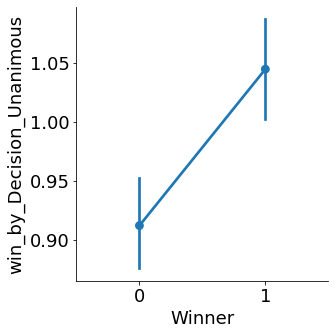

<Figure size 2160x936 with 0 Axes>

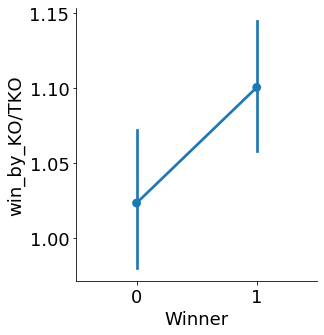

<Figure size 2160x936 with 0 Axes>

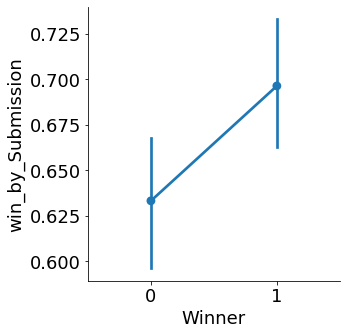

<Figure size 2160x936 with 0 Axes>

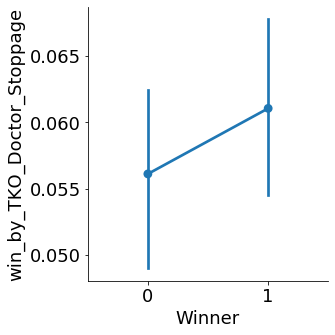

<Figure size 2160x936 with 0 Axes>

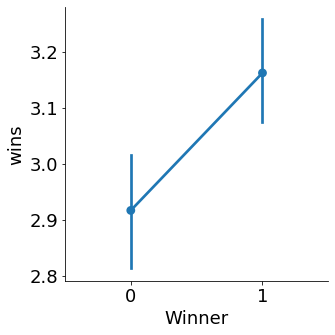

<Figure size 2160x936 with 0 Axes>

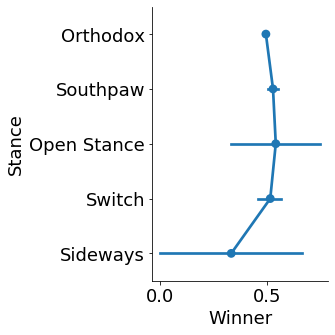

<Figure size 2160x936 with 0 Axes>

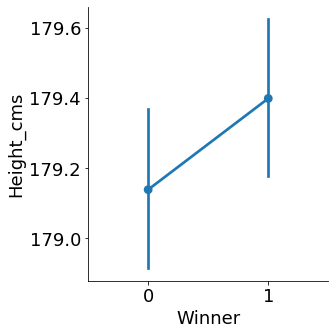

<Figure size 2160x936 with 0 Axes>

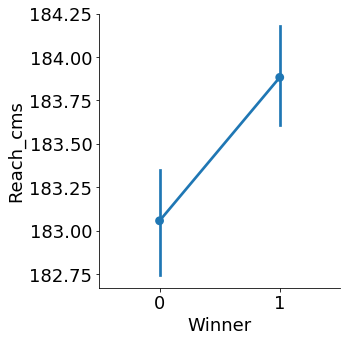

<Figure size 2160x936 with 0 Axes>

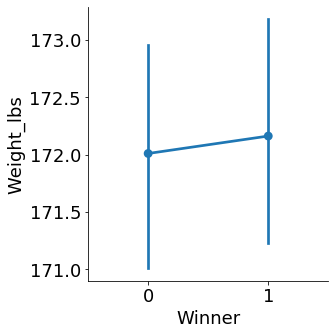

<Figure size 2160x936 with 0 Axes>

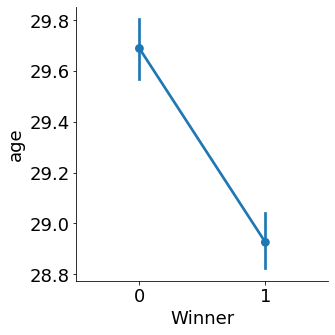

<Figure size 2160x936 with 0 Axes>

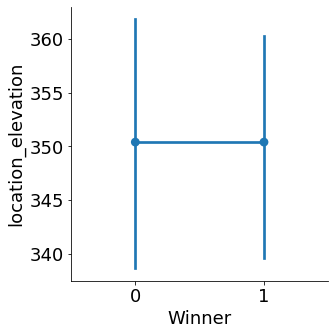

<Figure size 2160x936 with 0 Axes>

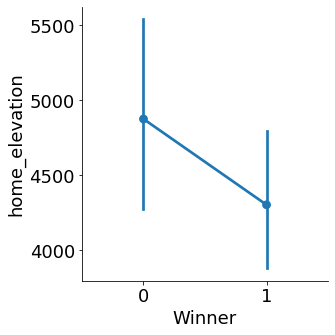

<Figure size 2160x936 with 0 Axes>

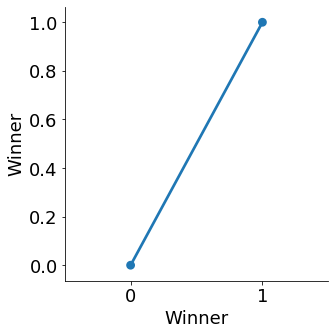

In [12]:
import seaborn as sns

def inspect_data(df, kind, columns):
    for column in columns:
        try:
            fig = plt.figure(figsize=(30, 13))
            sns.catplot(x='Winner', y=column, data=df, kind=kind);
            plt.show()
        except:
            pass

#Inspect data for all categorical features
kinds = ['box', 'point']
df = data.drop(columns=['fighter', 'city', 'country']).copy()
for kind in kinds:
    inspect_data(df, kind, df.columns)
    

# Explore distributions on a per weight-class basis
Explore box and point plots for features in dataset. Split by weight-class

<Figure size 2160x936 with 0 Axes>

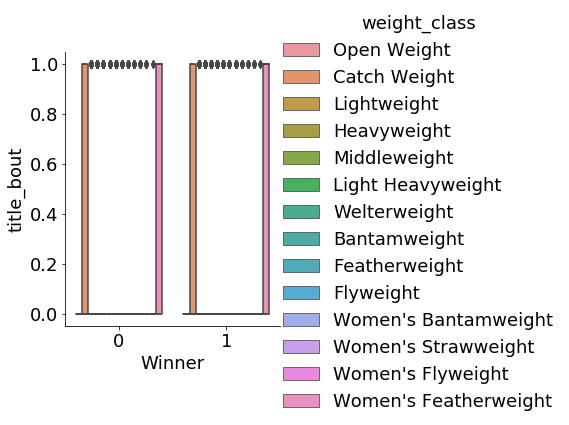

<Figure size 2160x936 with 0 Axes>

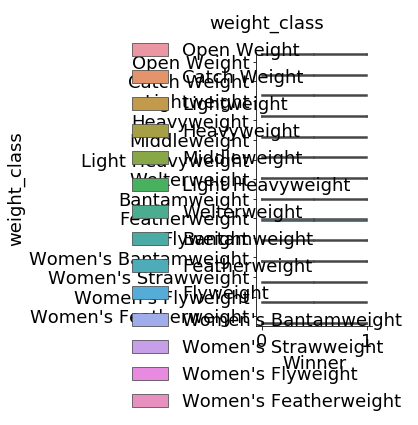

<Figure size 2160x936 with 0 Axes>

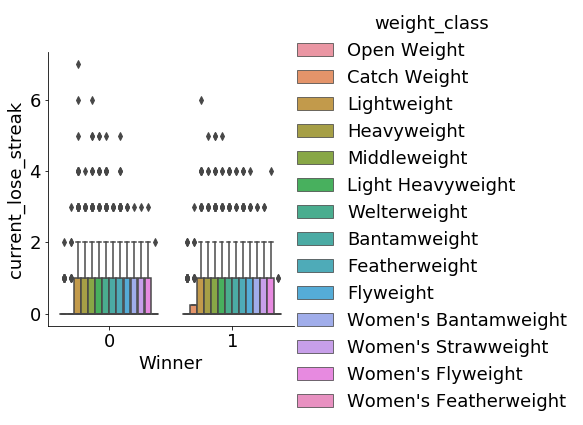

<Figure size 2160x936 with 0 Axes>

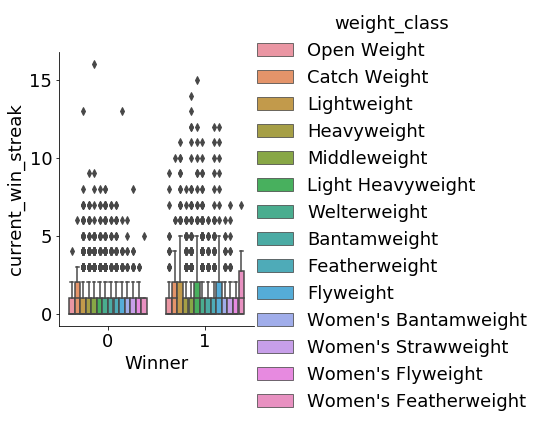

<Figure size 2160x936 with 0 Axes>

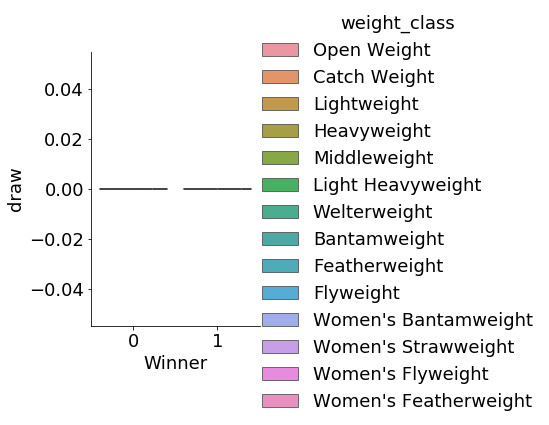

<Figure size 2160x936 with 0 Axes>

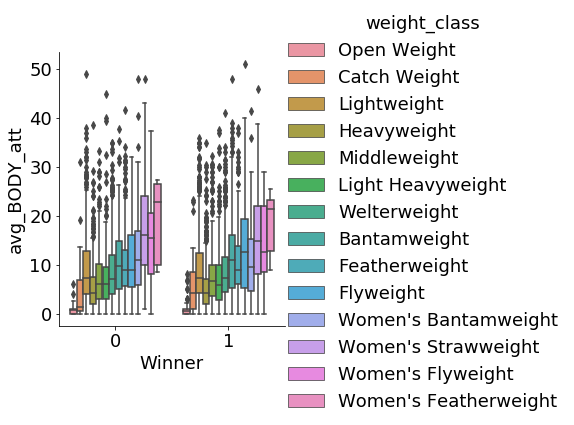

<Figure size 2160x936 with 0 Axes>

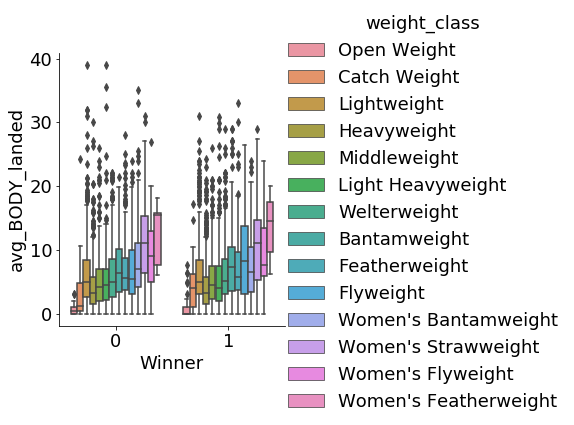

<Figure size 2160x936 with 0 Axes>

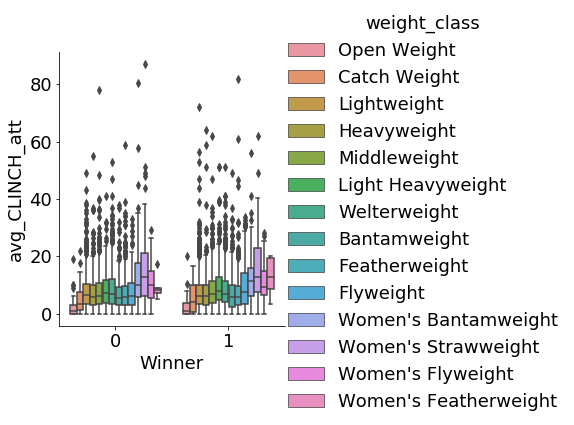

<Figure size 2160x936 with 0 Axes>

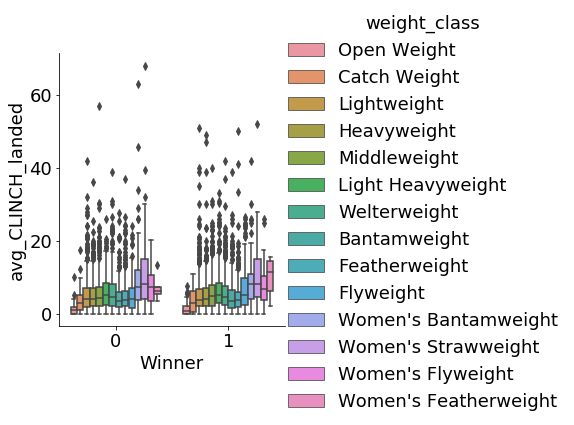

<Figure size 2160x936 with 0 Axes>

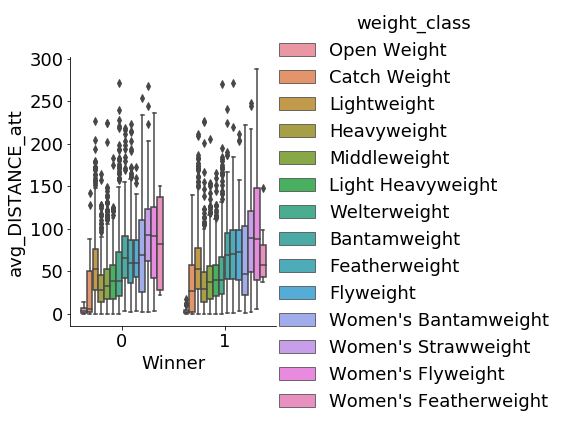

<Figure size 2160x936 with 0 Axes>

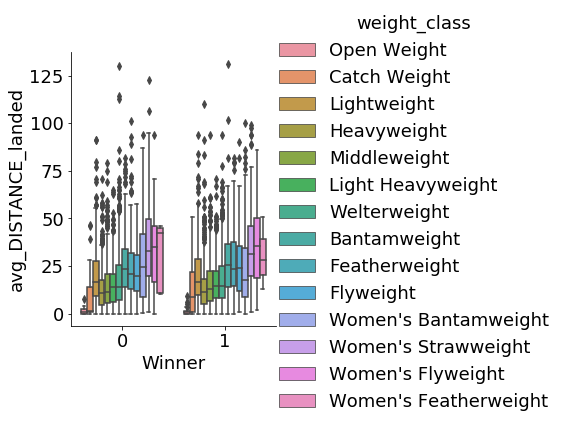

<Figure size 2160x936 with 0 Axes>

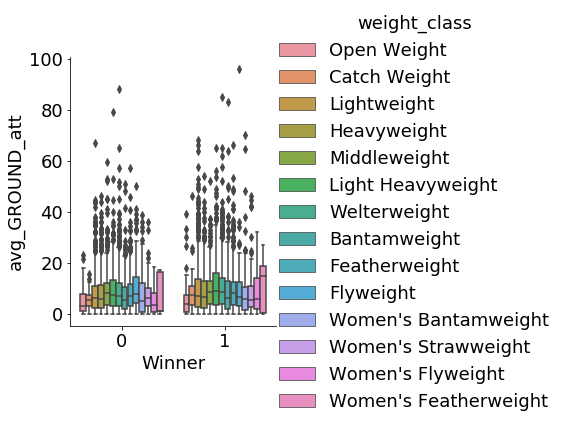

<Figure size 2160x936 with 0 Axes>

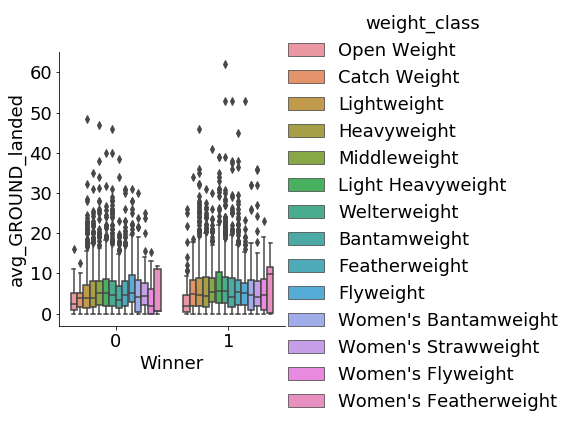

<Figure size 2160x936 with 0 Axes>

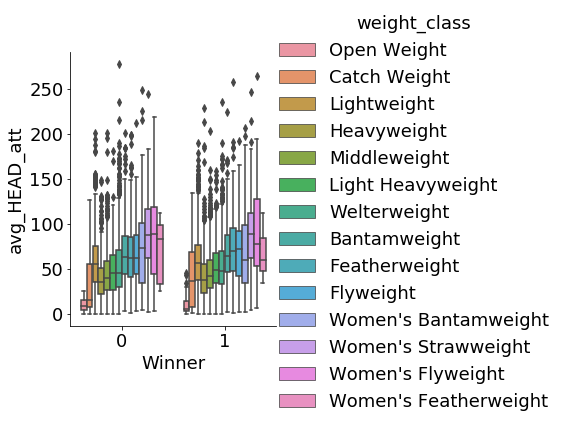

<Figure size 2160x936 with 0 Axes>

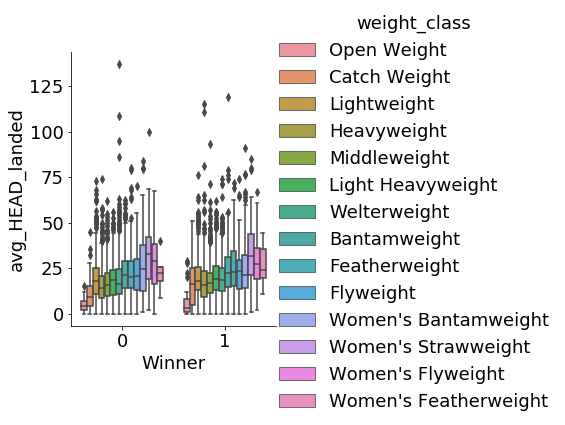

<Figure size 2160x936 with 0 Axes>

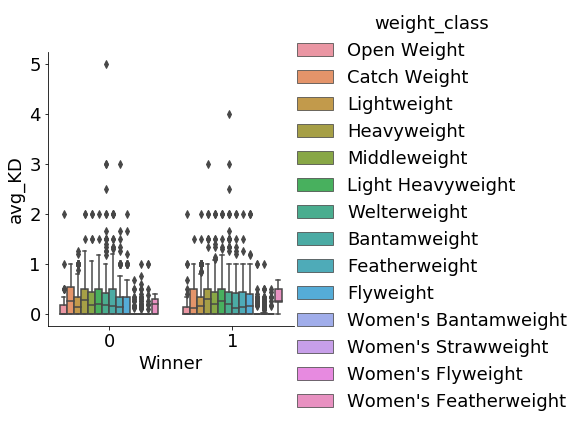

<Figure size 2160x936 with 0 Axes>

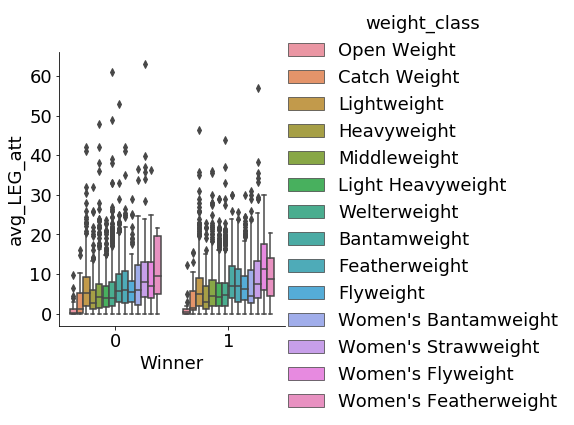

<Figure size 2160x936 with 0 Axes>

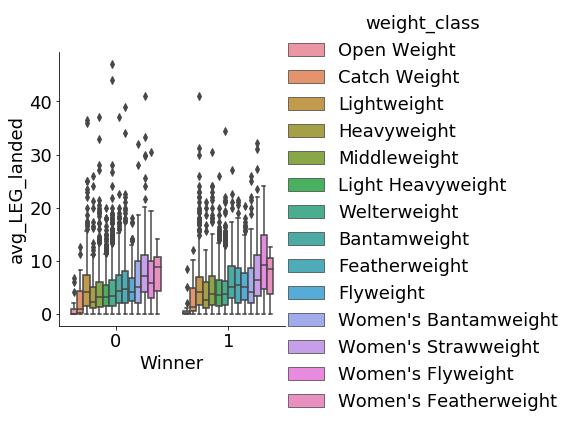

<Figure size 2160x936 with 0 Axes>

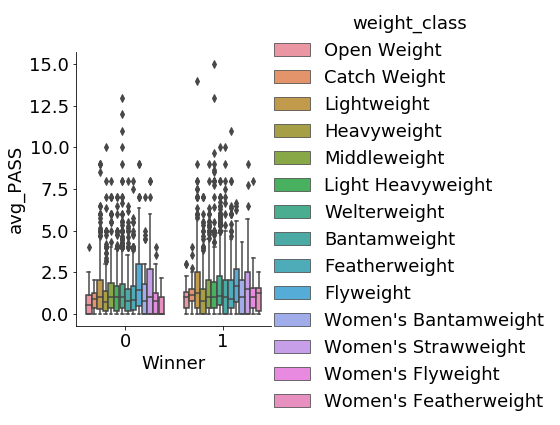

<Figure size 2160x936 with 0 Axes>

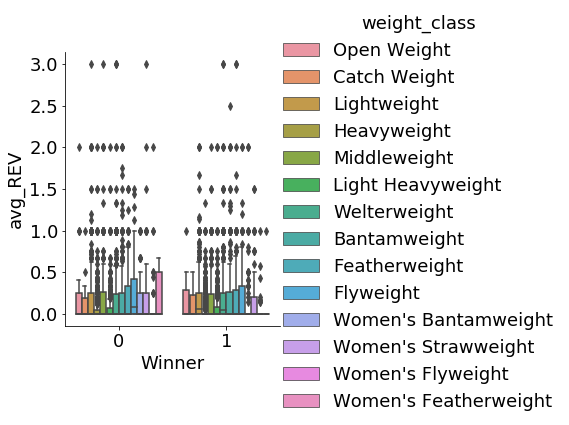

<Figure size 2160x936 with 0 Axes>

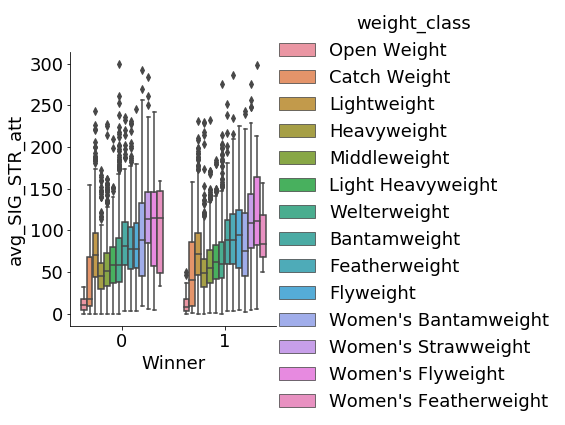

<Figure size 2160x936 with 0 Axes>

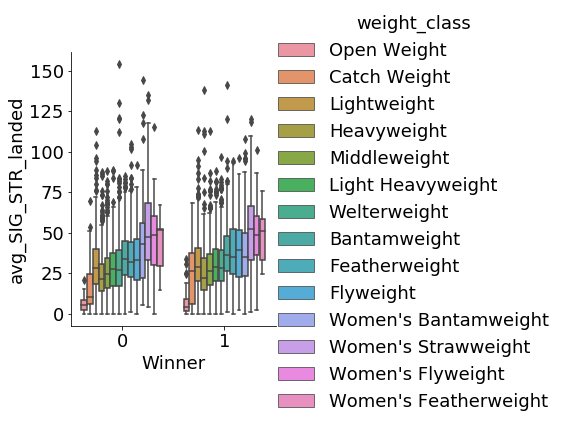

<Figure size 2160x936 with 0 Axes>

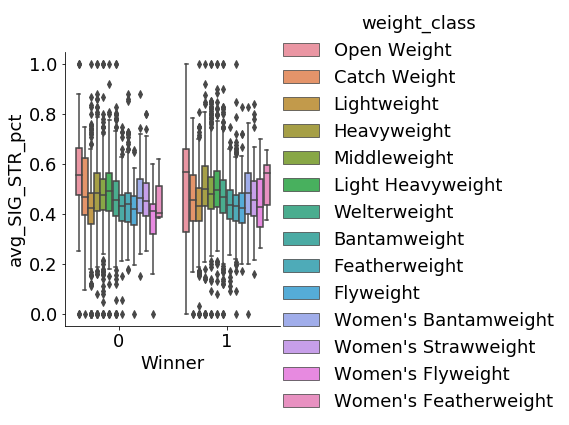

<Figure size 2160x936 with 0 Axes>

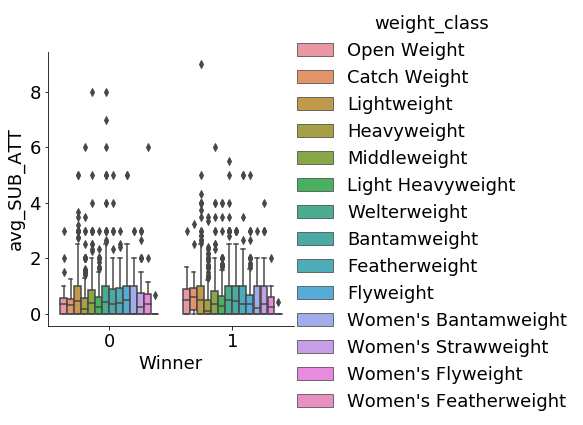

<Figure size 2160x936 with 0 Axes>

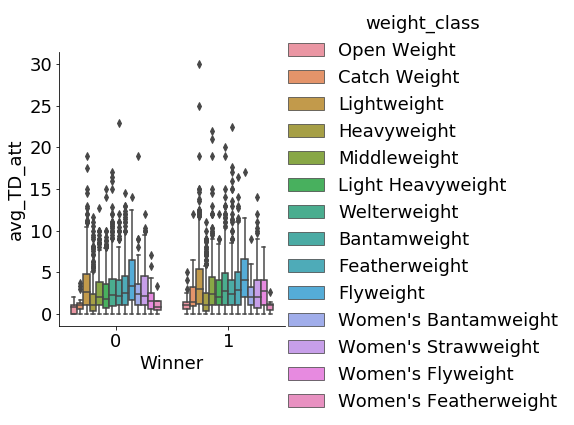

<Figure size 2160x936 with 0 Axes>

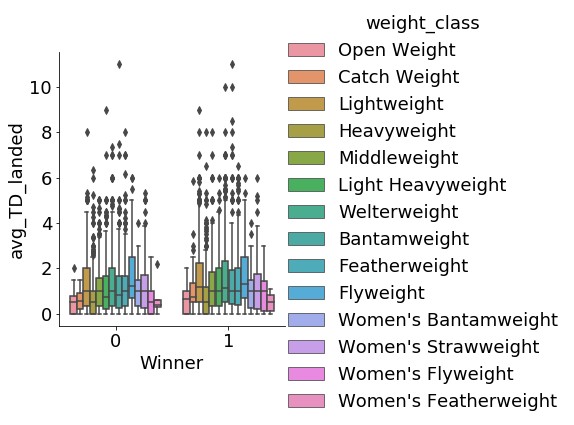

<Figure size 2160x936 with 0 Axes>

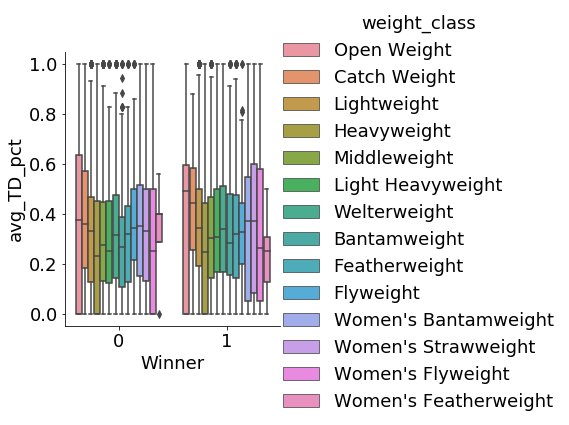

<Figure size 2160x936 with 0 Axes>

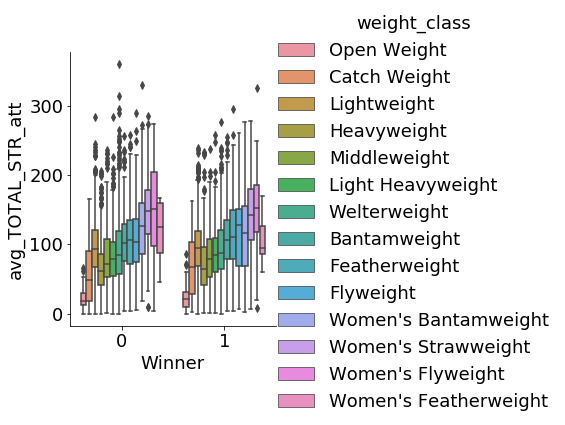

<Figure size 2160x936 with 0 Axes>

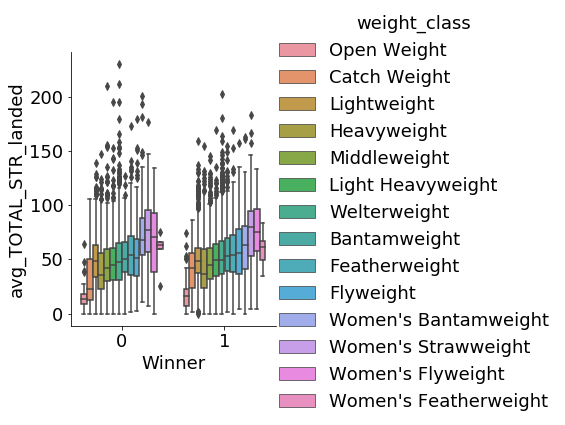

<Figure size 2160x936 with 0 Axes>

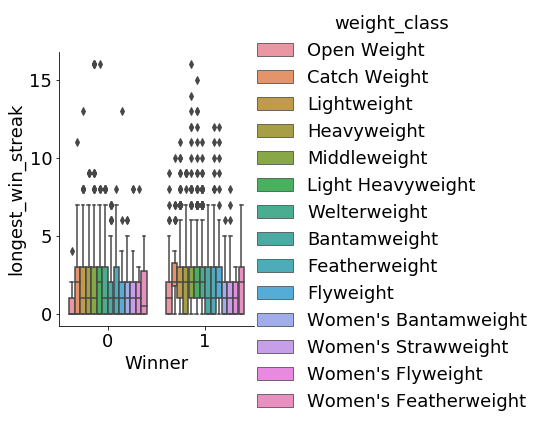

<Figure size 2160x936 with 0 Axes>

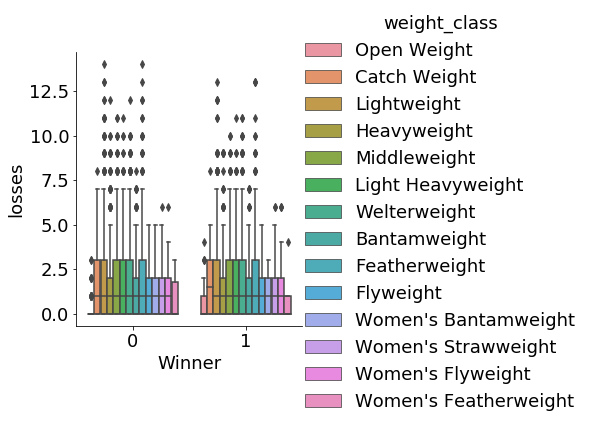

<Figure size 2160x936 with 0 Axes>

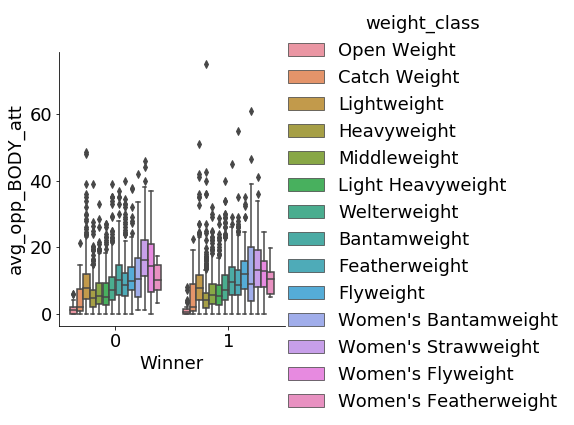

<Figure size 2160x936 with 0 Axes>

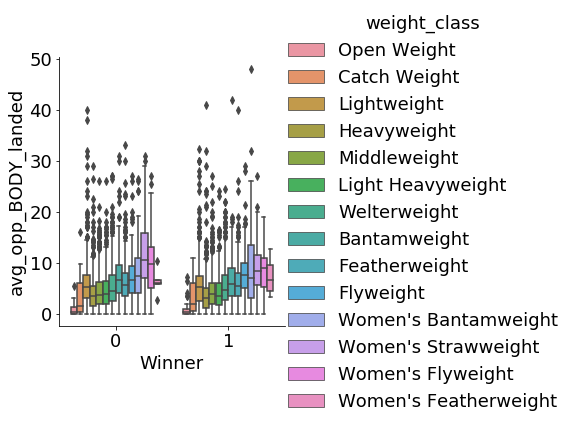

<Figure size 2160x936 with 0 Axes>

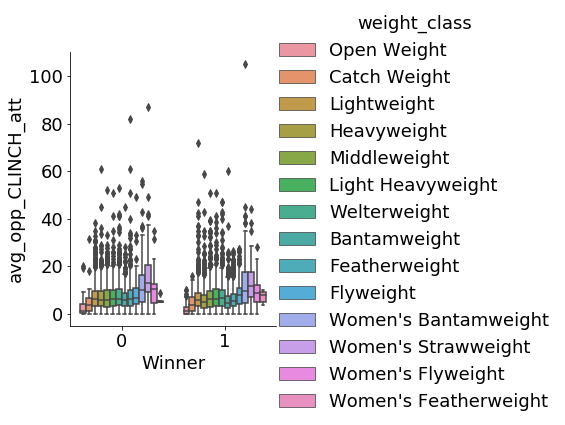

<Figure size 2160x936 with 0 Axes>

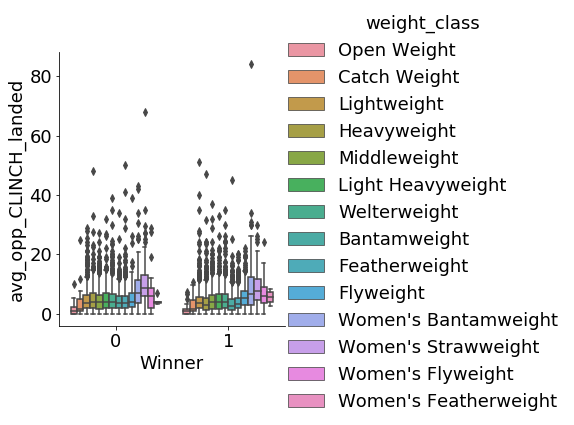

<Figure size 2160x936 with 0 Axes>

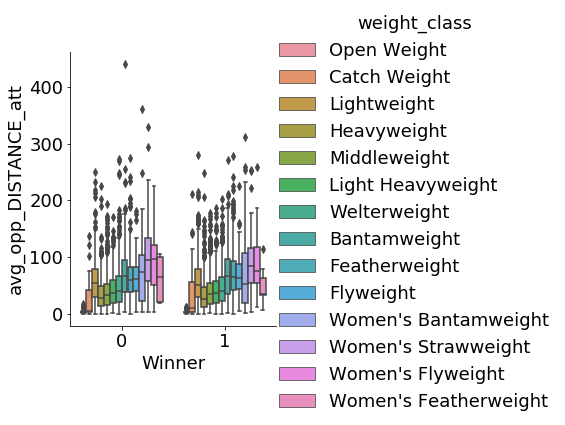

<Figure size 2160x936 with 0 Axes>

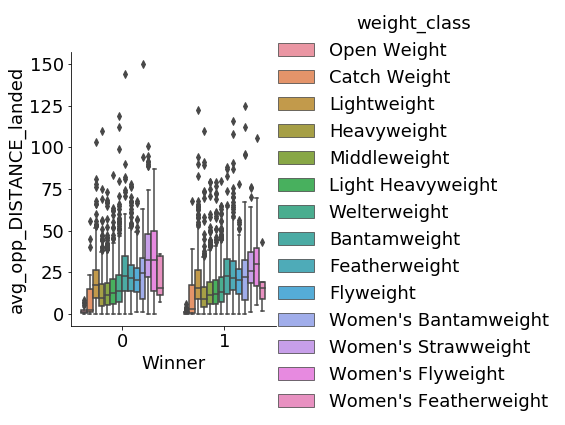

<Figure size 2160x936 with 0 Axes>

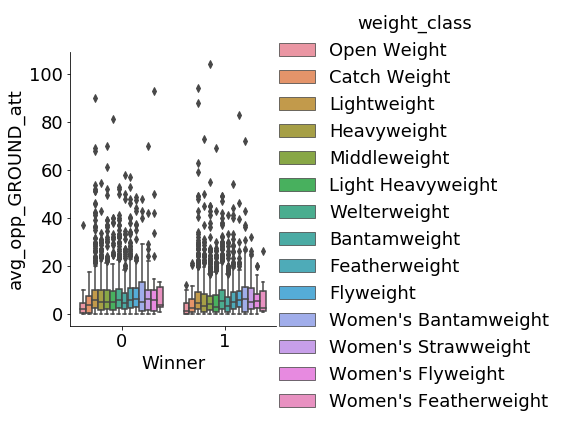

<Figure size 2160x936 with 0 Axes>

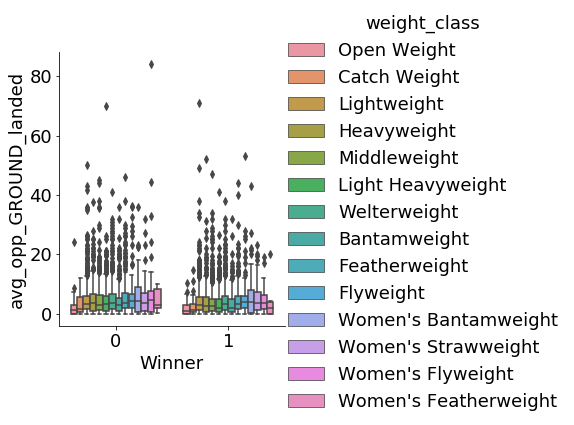

<Figure size 2160x936 with 0 Axes>

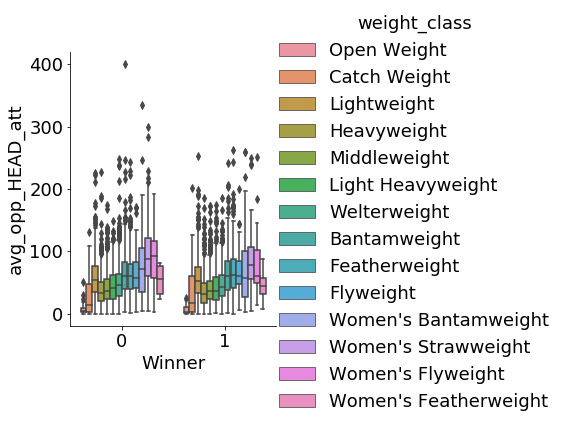

<Figure size 2160x936 with 0 Axes>

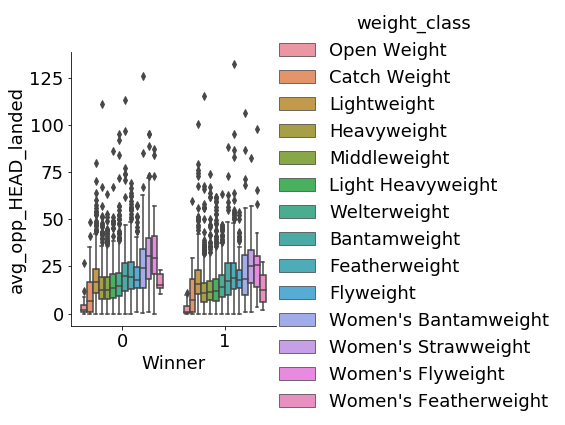

<Figure size 2160x936 with 0 Axes>

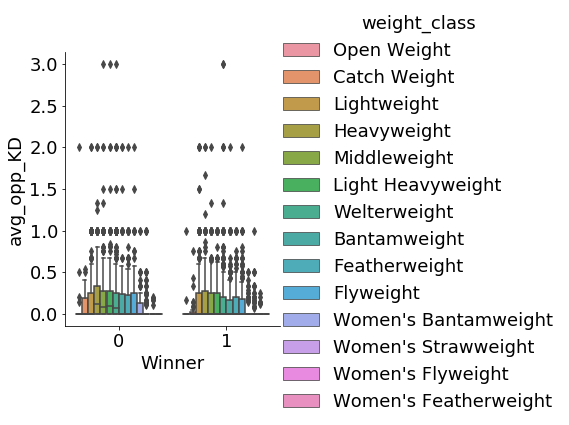

<Figure size 2160x936 with 0 Axes>

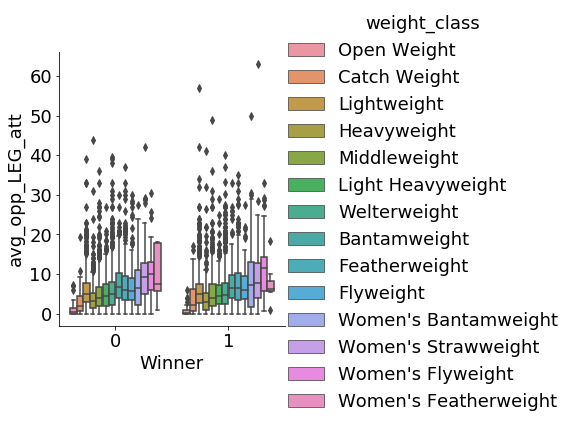

<Figure size 2160x936 with 0 Axes>

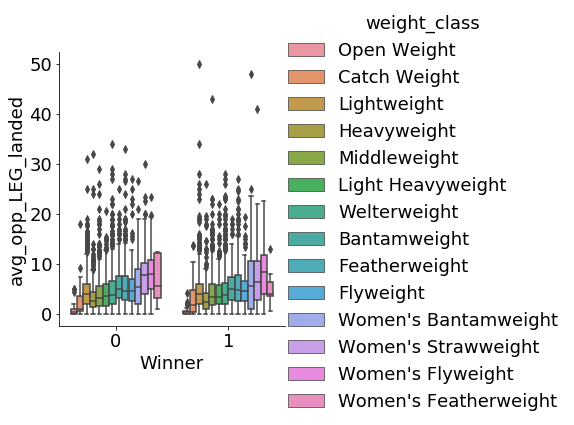

<Figure size 2160x936 with 0 Axes>

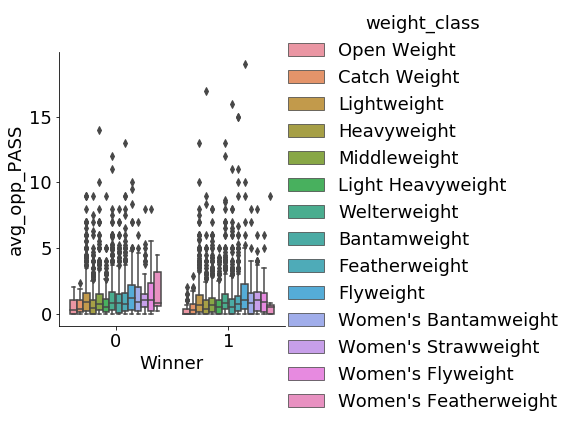

<Figure size 2160x936 with 0 Axes>

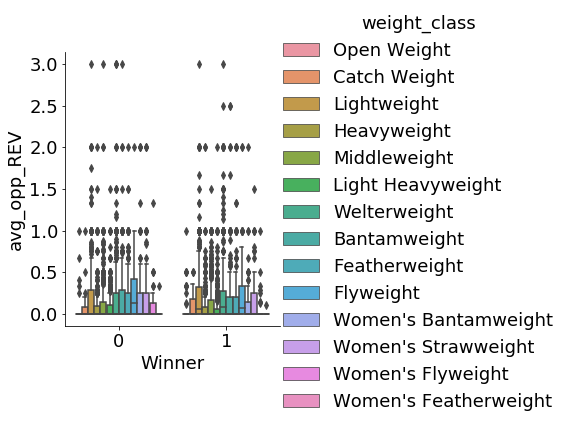

<Figure size 2160x936 with 0 Axes>

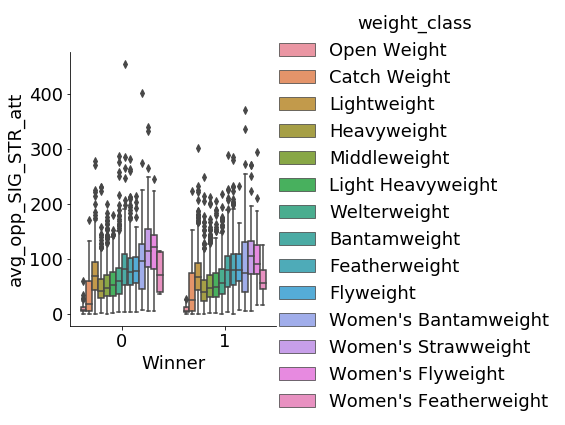

<Figure size 2160x936 with 0 Axes>

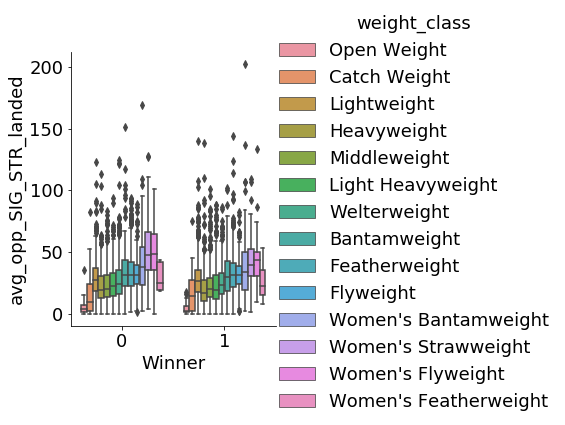

<Figure size 2160x936 with 0 Axes>

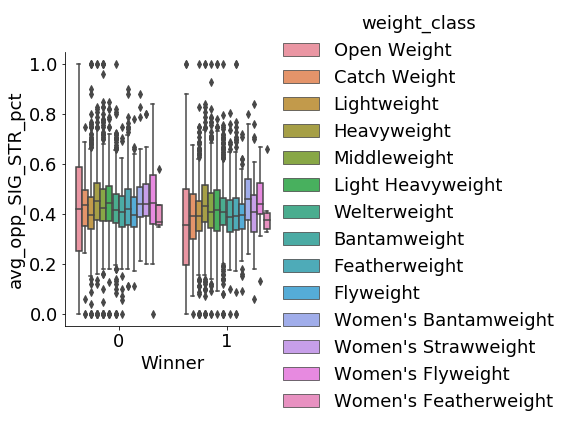

<Figure size 2160x936 with 0 Axes>

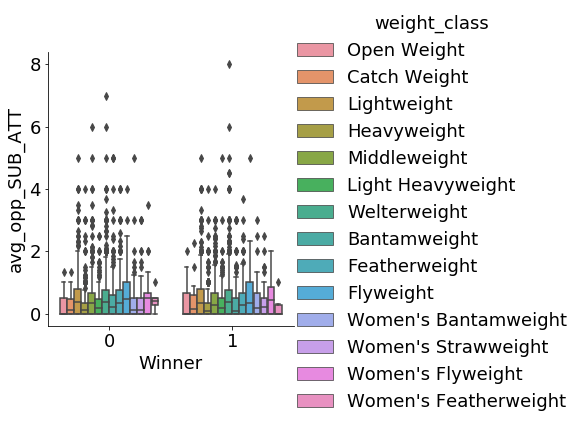

<Figure size 2160x936 with 0 Axes>

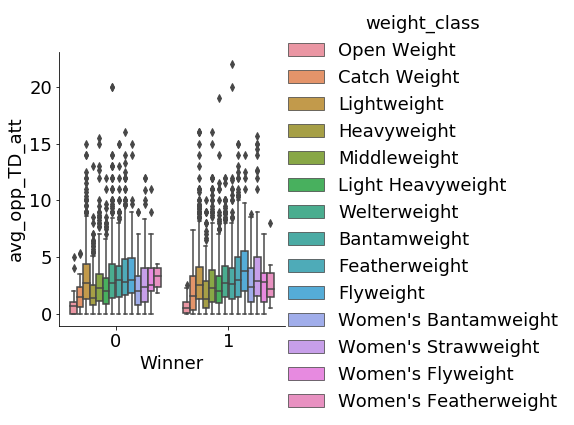

<Figure size 2160x936 with 0 Axes>

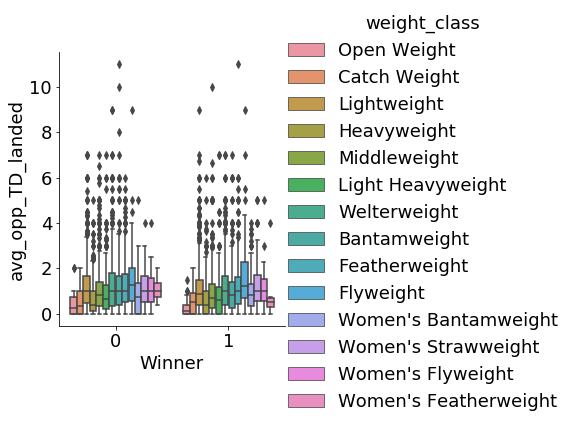

<Figure size 2160x936 with 0 Axes>

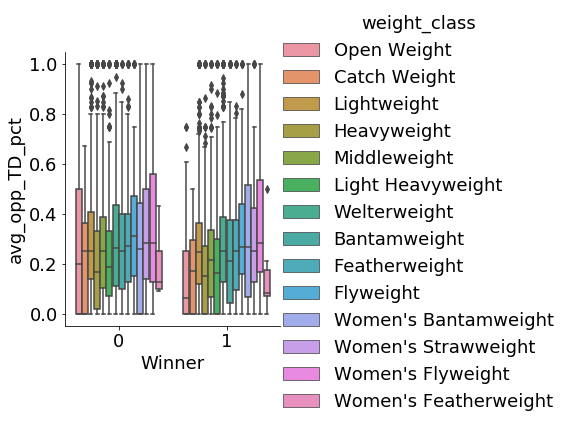

<Figure size 2160x936 with 0 Axes>

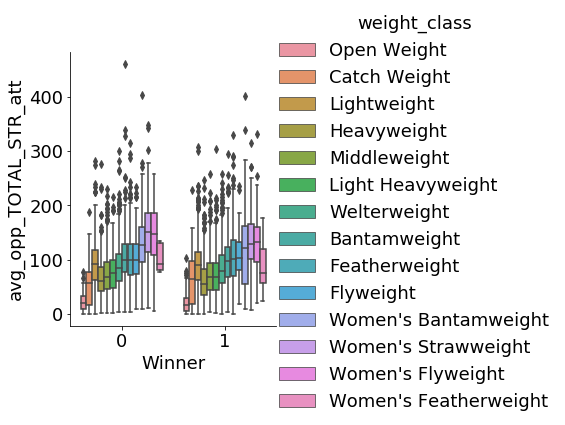

<Figure size 2160x936 with 0 Axes>

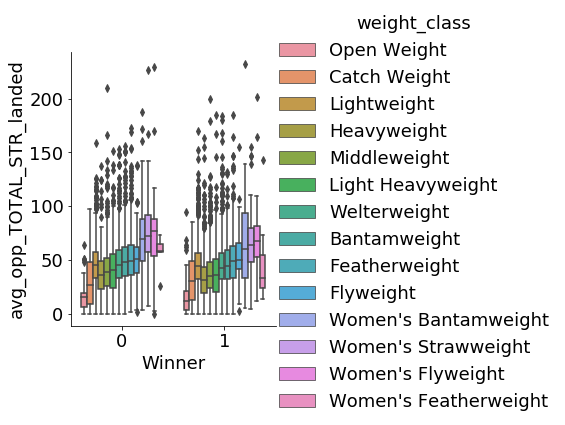

<Figure size 2160x936 with 0 Axes>

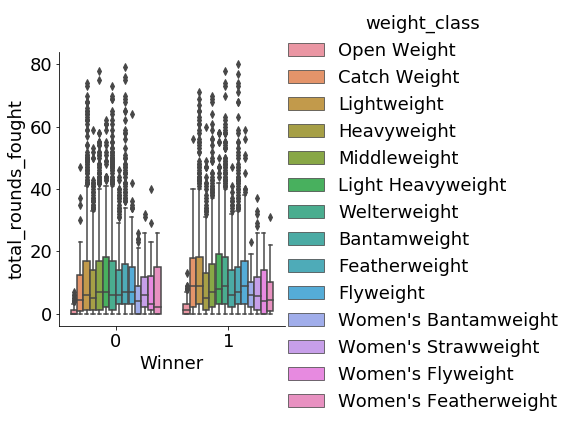

<Figure size 2160x936 with 0 Axes>

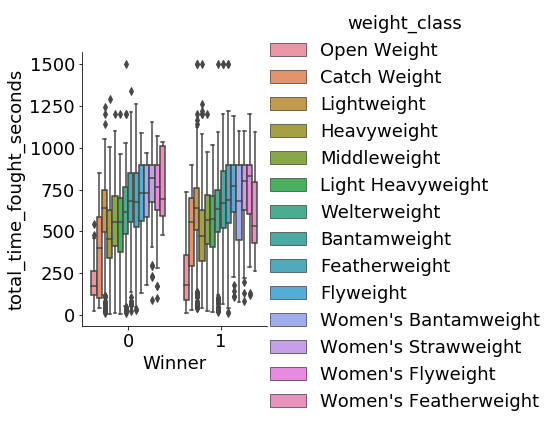

<Figure size 2160x936 with 0 Axes>

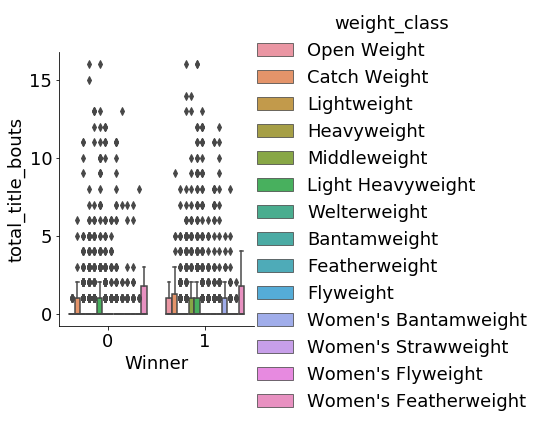

<Figure size 2160x936 with 0 Axes>

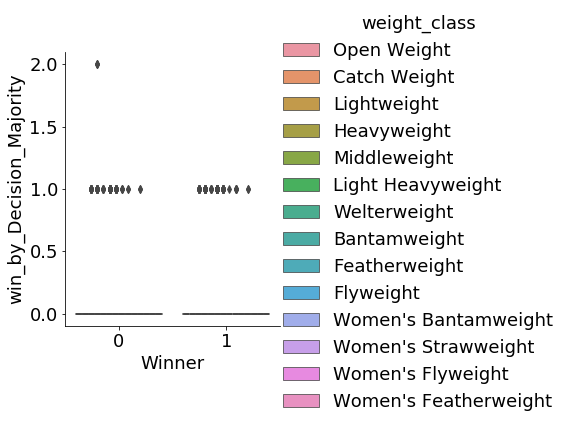

<Figure size 2160x936 with 0 Axes>

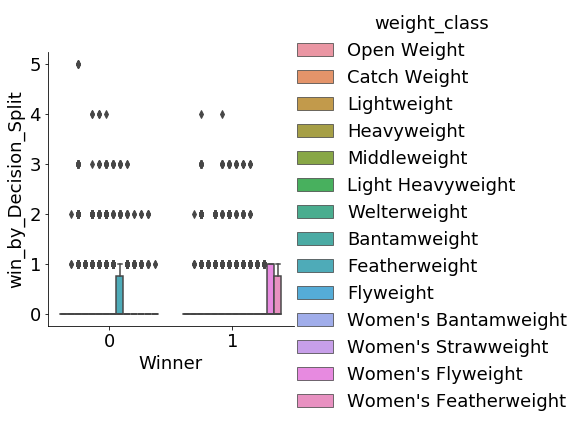

<Figure size 2160x936 with 0 Axes>

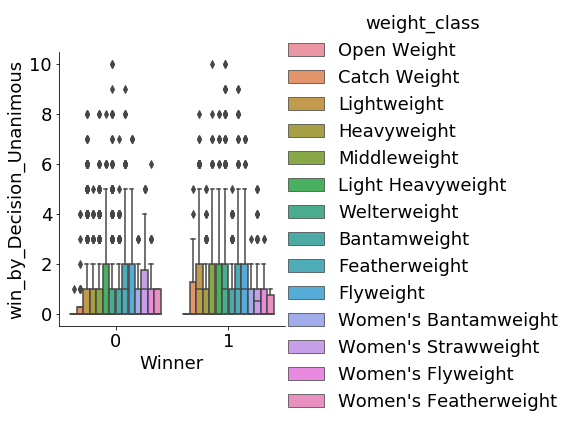

<Figure size 2160x936 with 0 Axes>

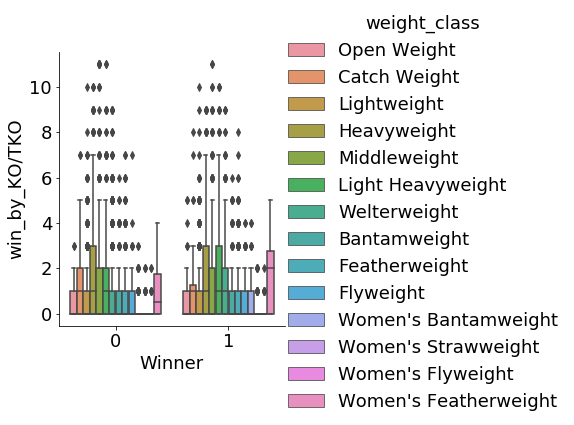

<Figure size 2160x936 with 0 Axes>

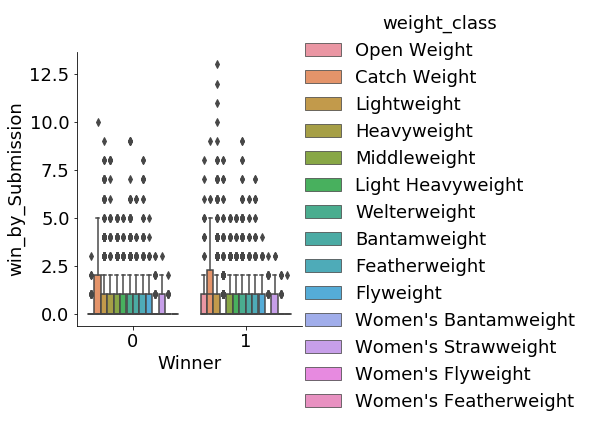

<Figure size 2160x936 with 0 Axes>

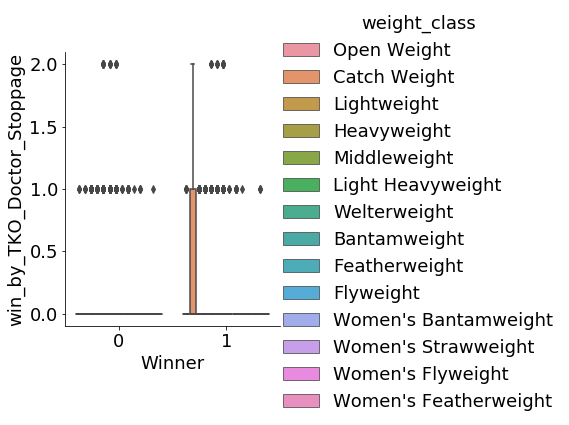

<Figure size 2160x936 with 0 Axes>

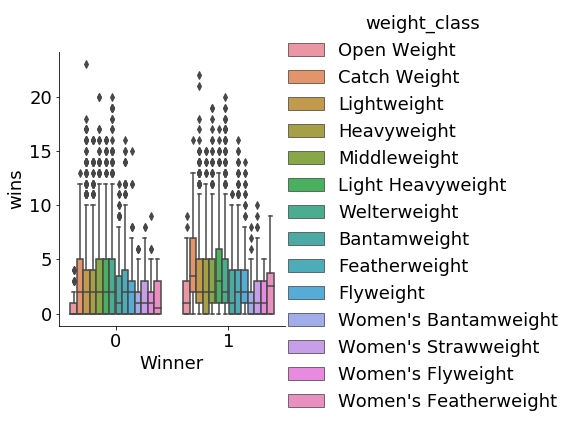

<Figure size 2160x936 with 0 Axes>

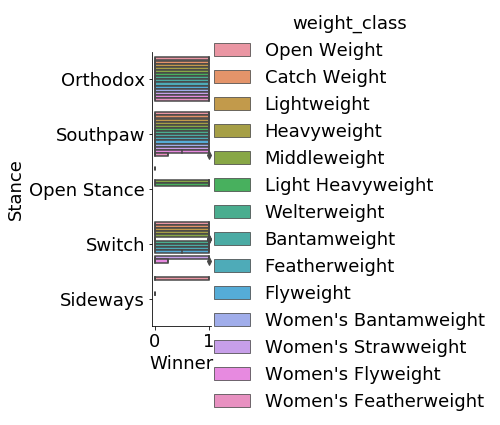

<Figure size 2160x936 with 0 Axes>

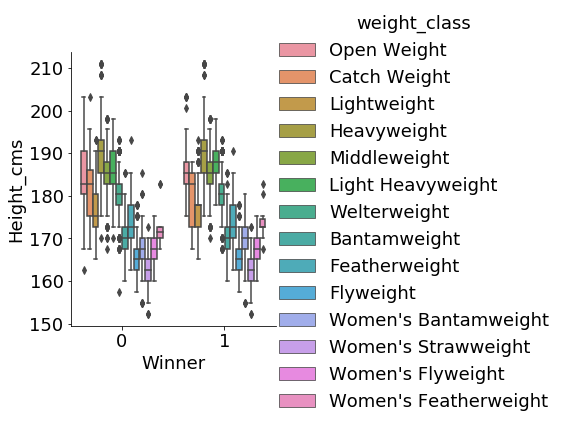

<Figure size 2160x936 with 0 Axes>

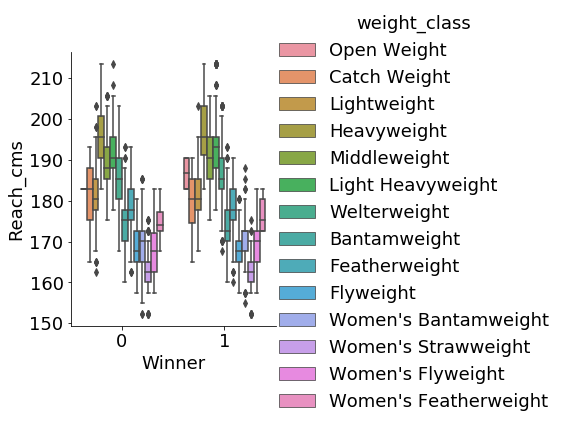

<Figure size 2160x936 with 0 Axes>

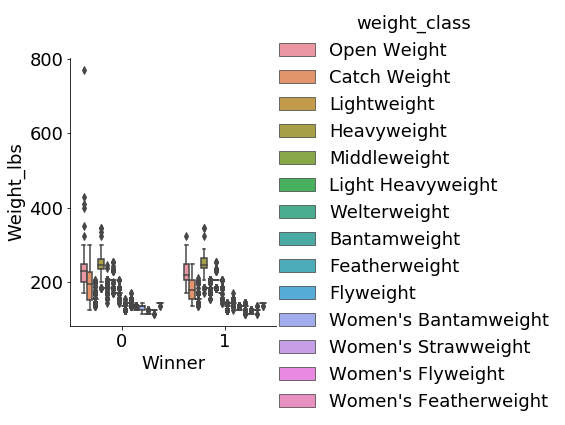

<Figure size 2160x936 with 0 Axes>

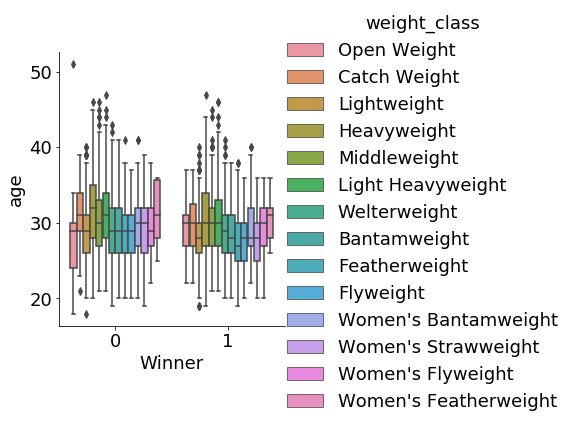

<Figure size 2160x936 with 0 Axes>

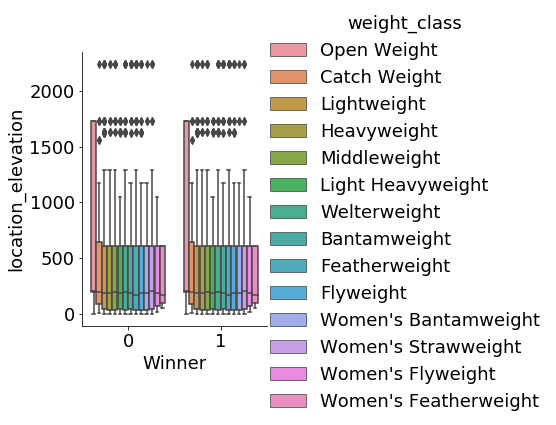

<Figure size 2160x936 with 0 Axes>

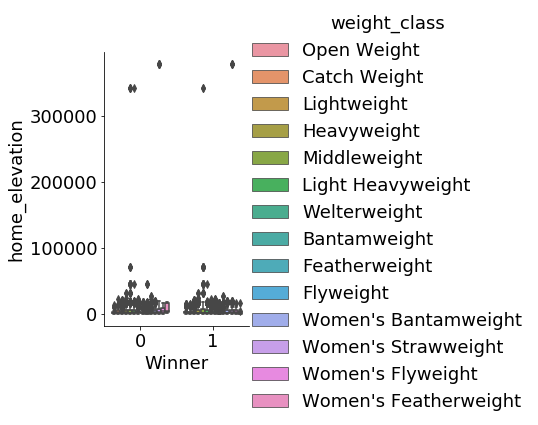

<Figure size 2160x936 with 0 Axes>

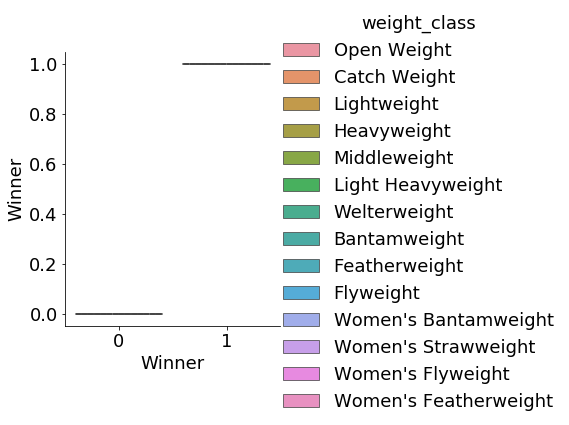

<Figure size 2160x936 with 0 Axes>

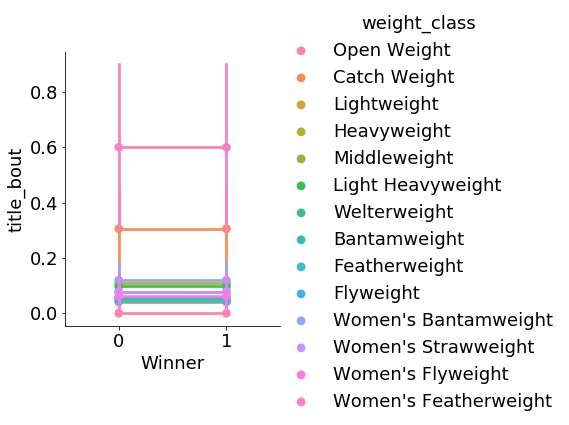

<Figure size 2160x936 with 0 Axes>

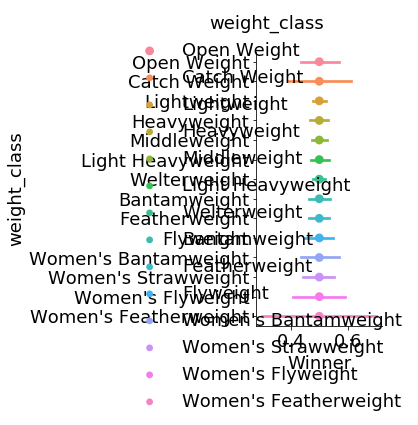

<Figure size 2160x936 with 0 Axes>

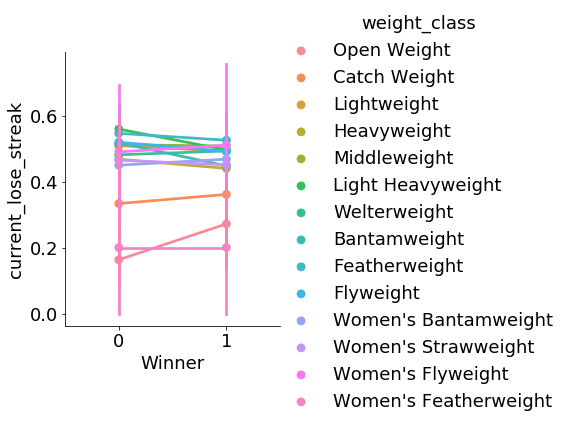

<Figure size 2160x936 with 0 Axes>

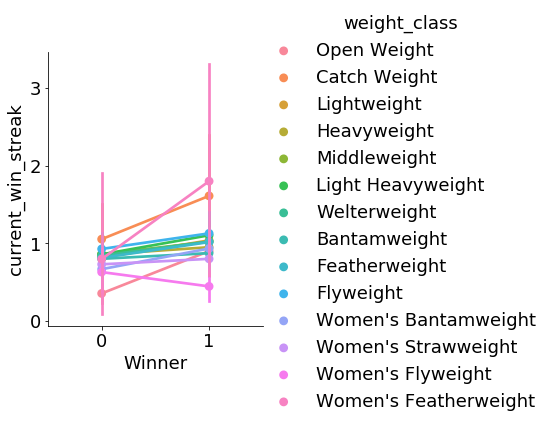

<Figure size 2160x936 with 0 Axes>

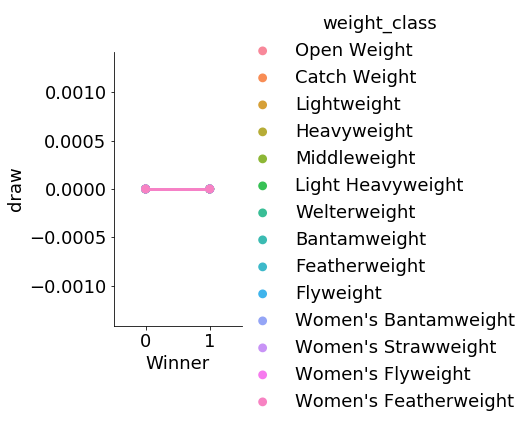

<Figure size 2160x936 with 0 Axes>

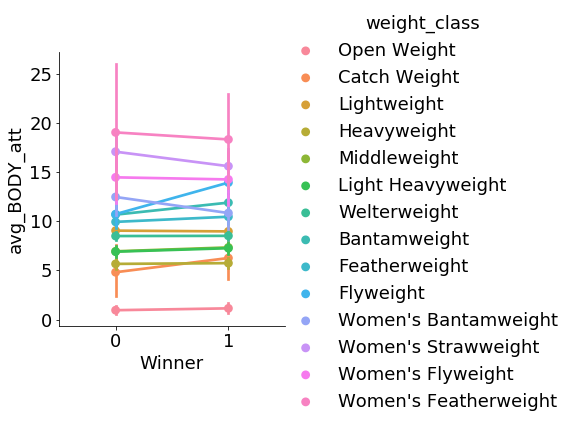

<Figure size 2160x936 with 0 Axes>

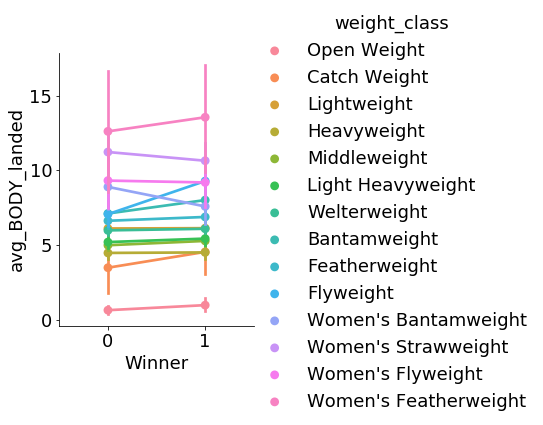

<Figure size 2160x936 with 0 Axes>

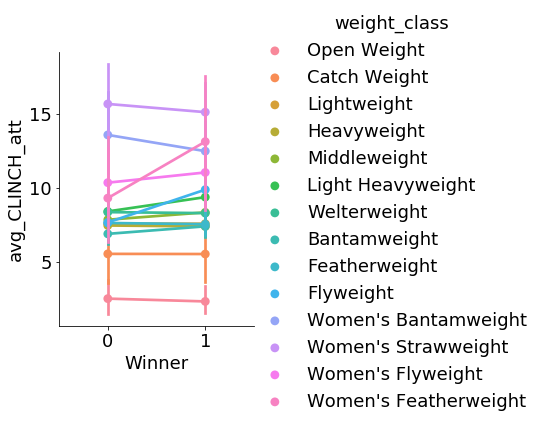

<Figure size 2160x936 with 0 Axes>

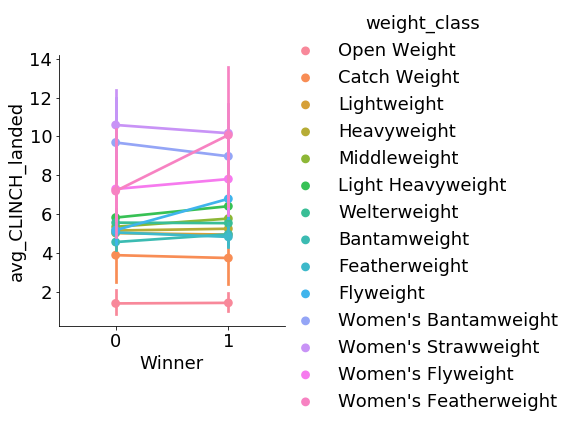

<Figure size 2160x936 with 0 Axes>

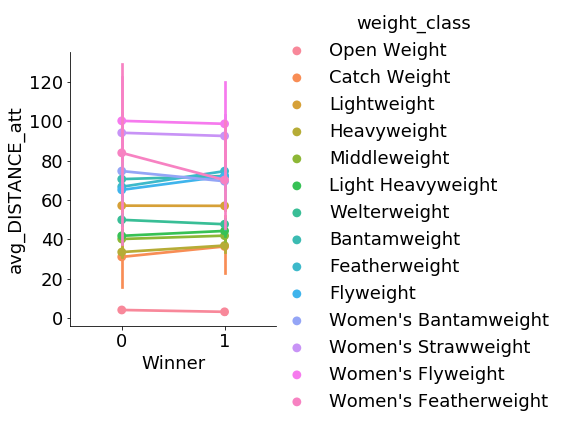

<Figure size 2160x936 with 0 Axes>

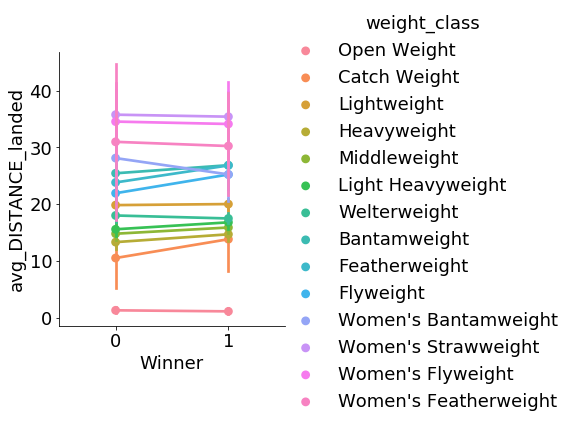

<Figure size 2160x936 with 0 Axes>

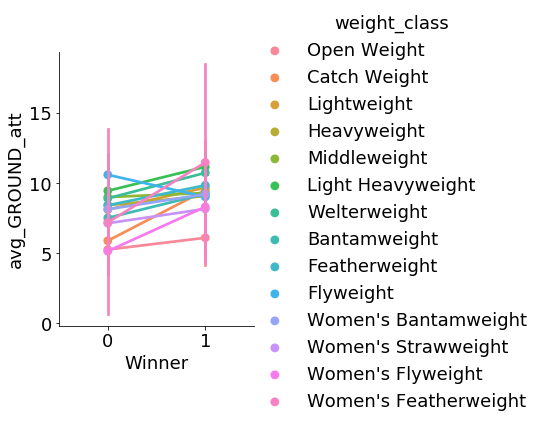

<Figure size 2160x936 with 0 Axes>

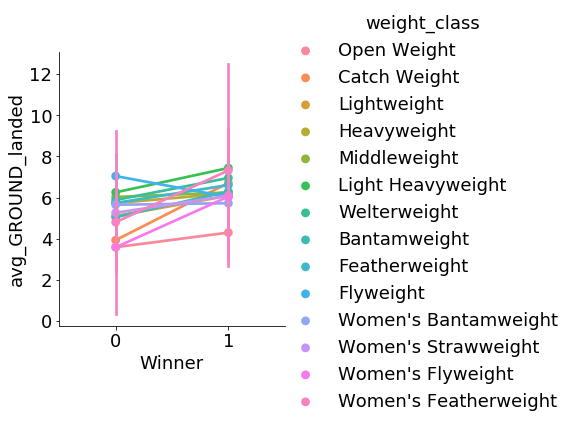

<Figure size 2160x936 with 0 Axes>

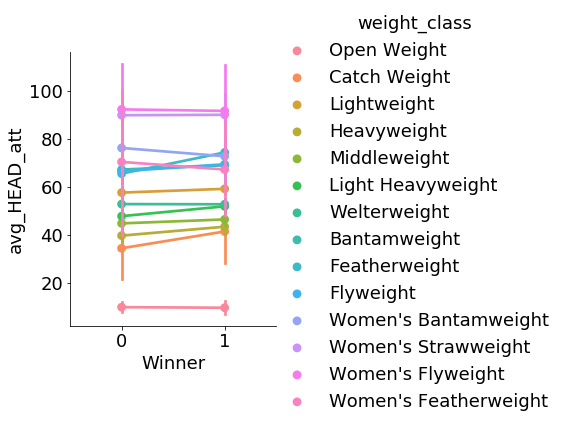

<Figure size 2160x936 with 0 Axes>

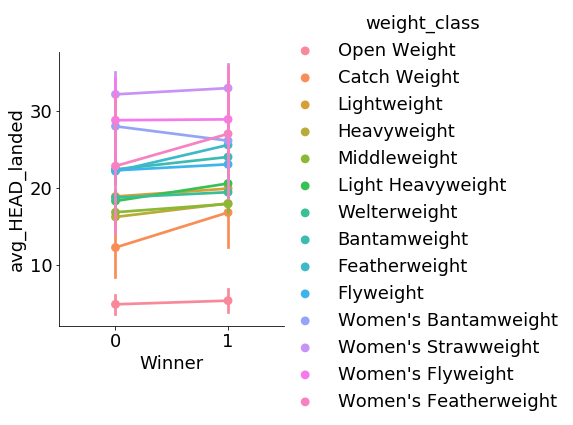

<Figure size 2160x936 with 0 Axes>

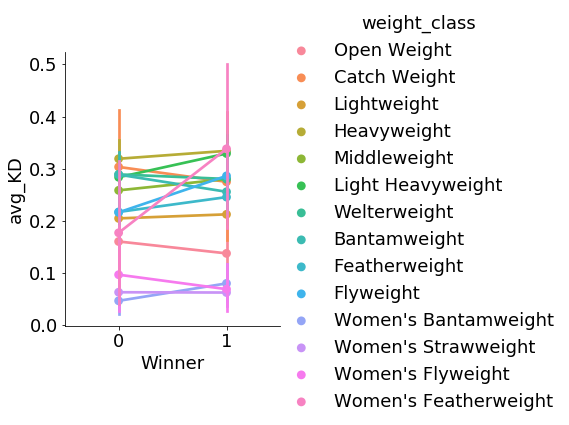

<Figure size 2160x936 with 0 Axes>

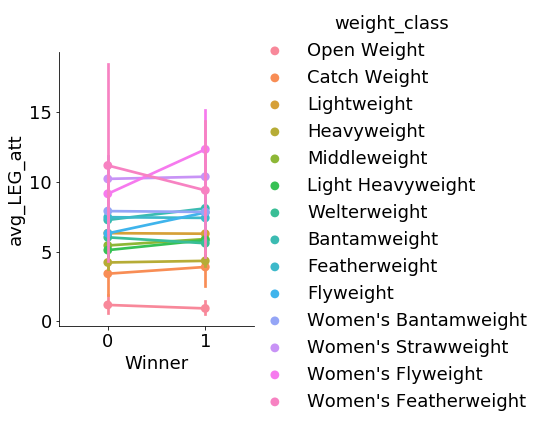

<Figure size 2160x936 with 0 Axes>

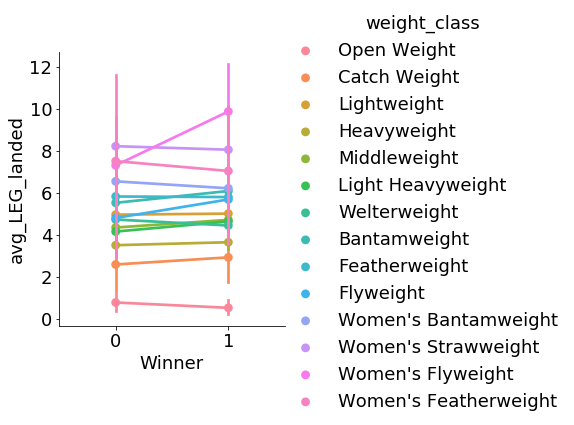

<Figure size 2160x936 with 0 Axes>

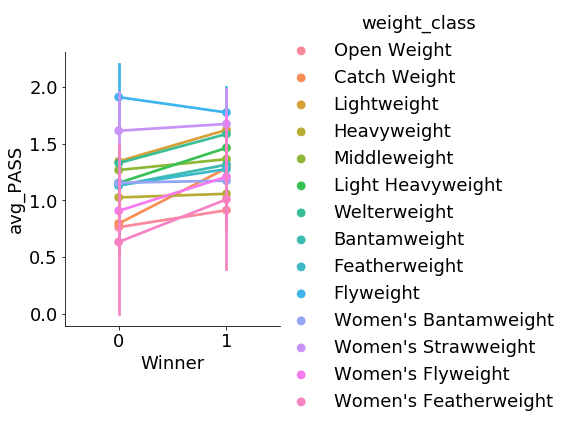

<Figure size 2160x936 with 0 Axes>

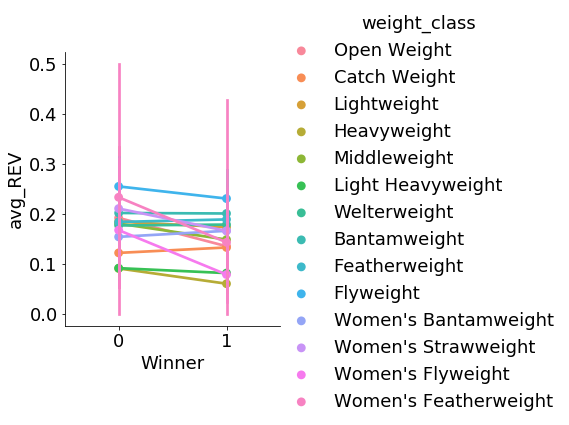

<Figure size 2160x936 with 0 Axes>

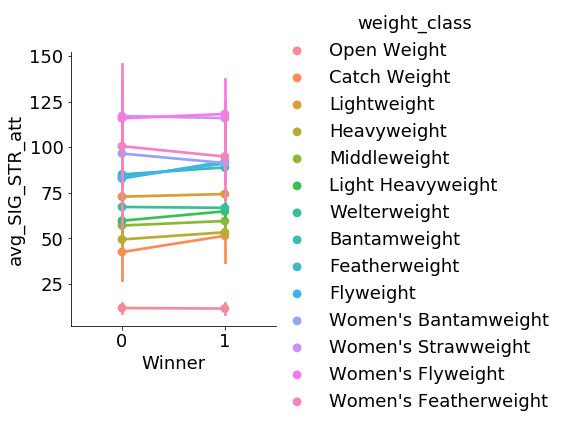

<Figure size 2160x936 with 0 Axes>

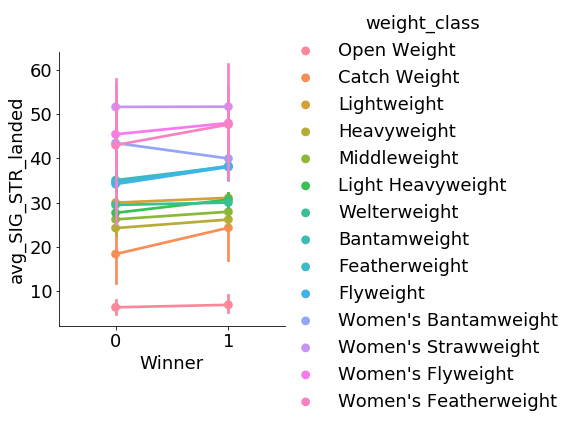

<Figure size 2160x936 with 0 Axes>

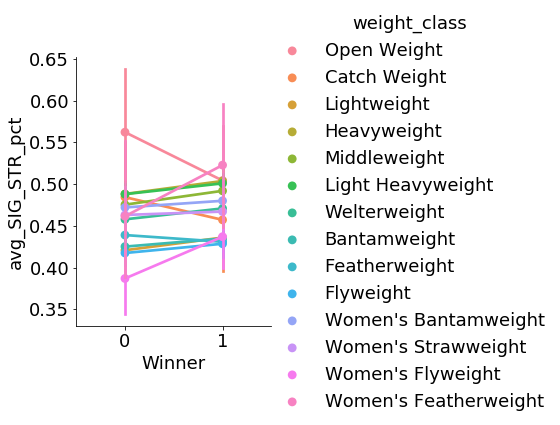

<Figure size 2160x936 with 0 Axes>

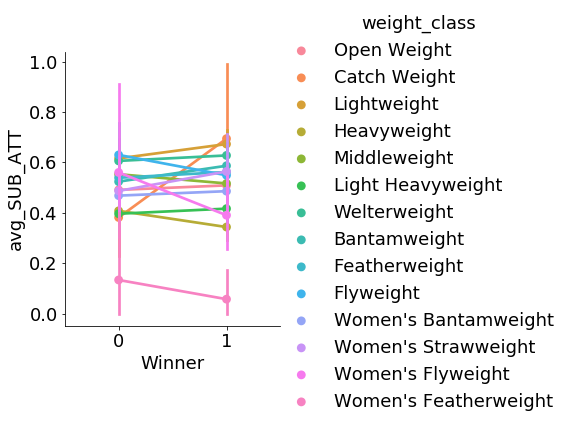

<Figure size 2160x936 with 0 Axes>

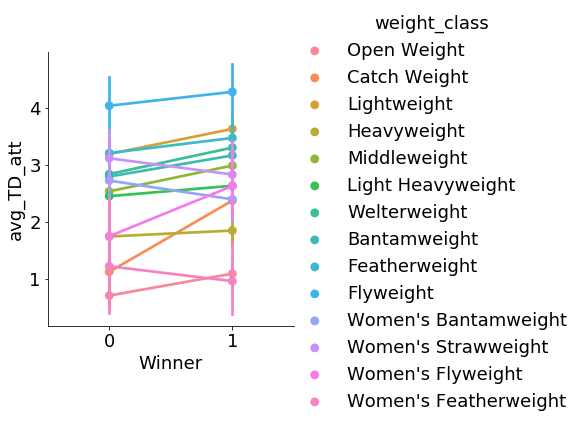

<Figure size 2160x936 with 0 Axes>

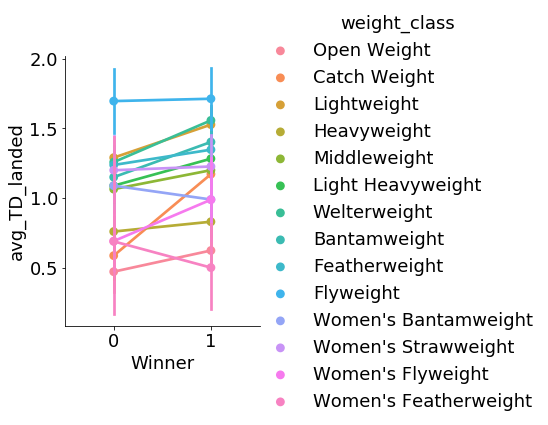

<Figure size 2160x936 with 0 Axes>

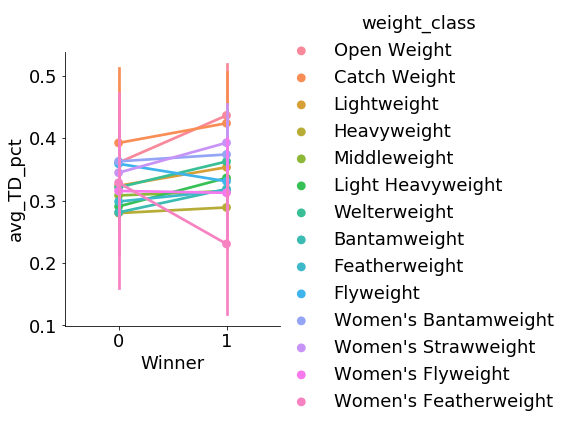

<Figure size 2160x936 with 0 Axes>

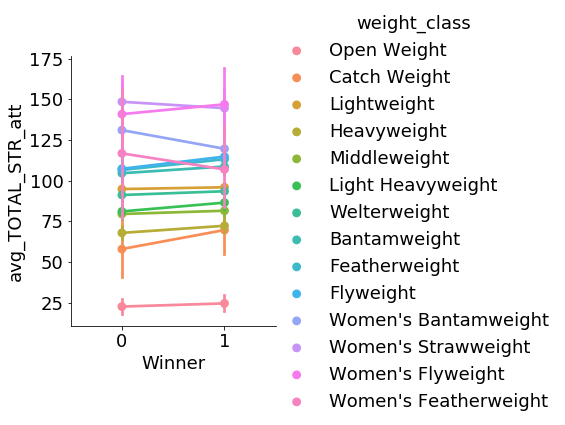

<Figure size 2160x936 with 0 Axes>

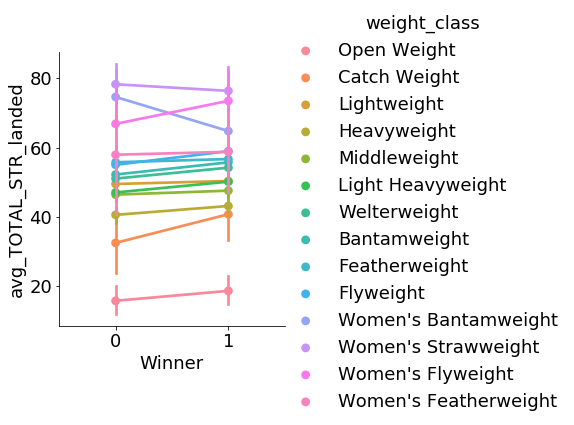

<Figure size 2160x936 with 0 Axes>

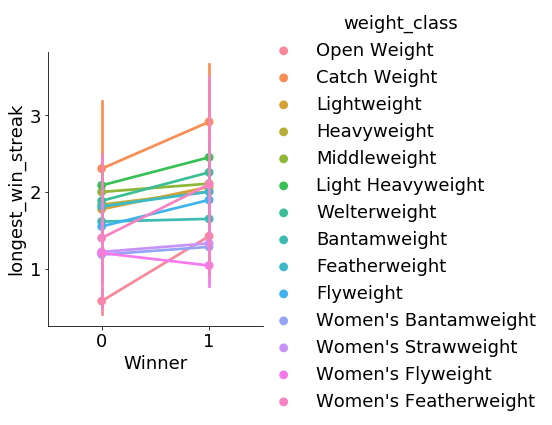

<Figure size 2160x936 with 0 Axes>

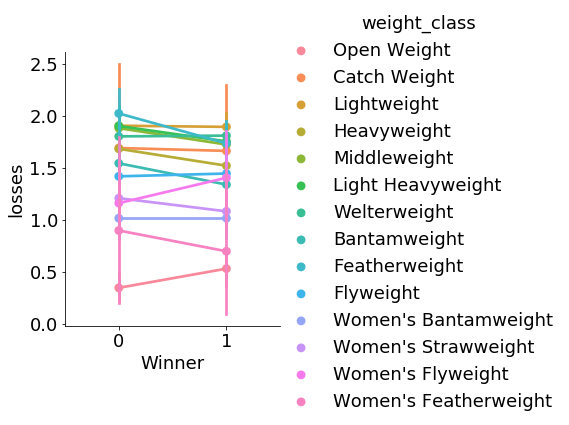

<Figure size 2160x936 with 0 Axes>

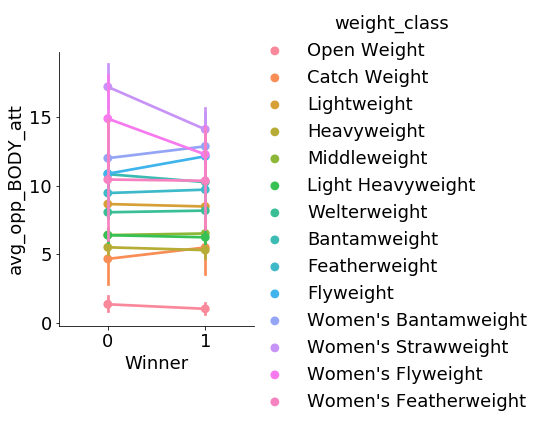

<Figure size 2160x936 with 0 Axes>

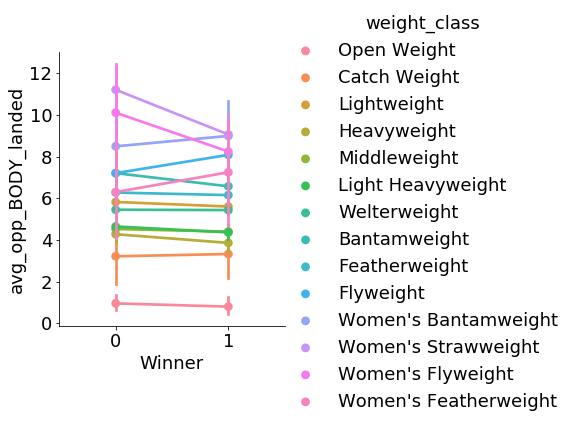

<Figure size 2160x936 with 0 Axes>

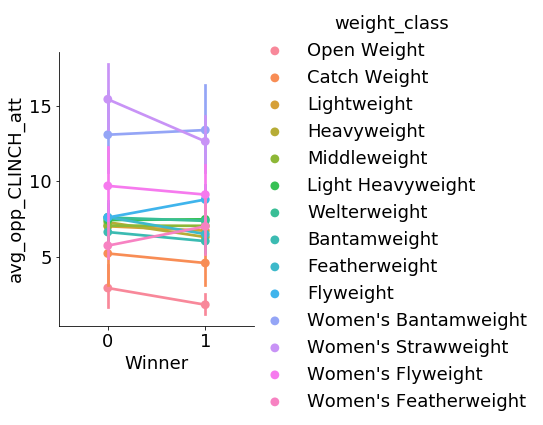

<Figure size 2160x936 with 0 Axes>

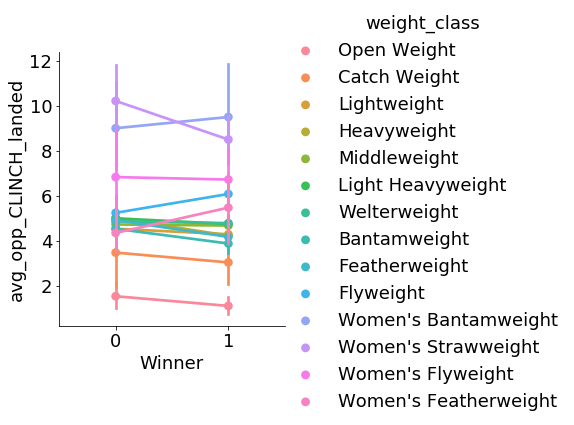

<Figure size 2160x936 with 0 Axes>

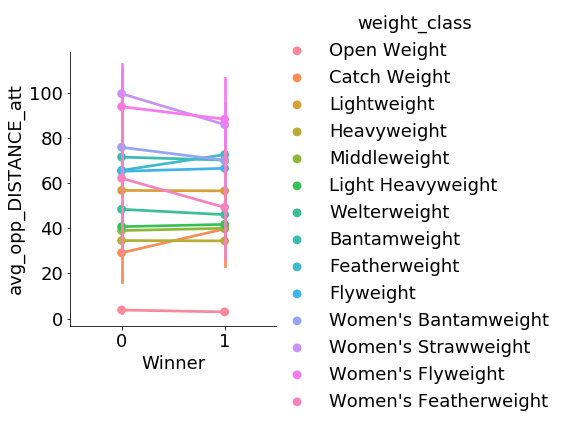

<Figure size 2160x936 with 0 Axes>

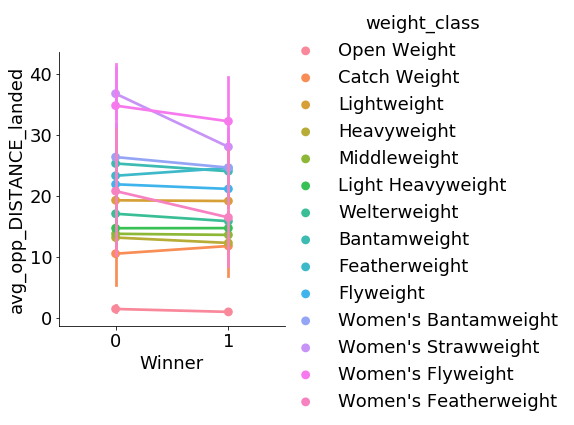

<Figure size 2160x936 with 0 Axes>

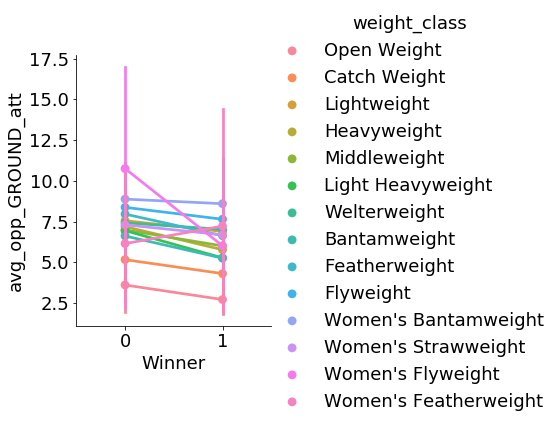

<Figure size 2160x936 with 0 Axes>

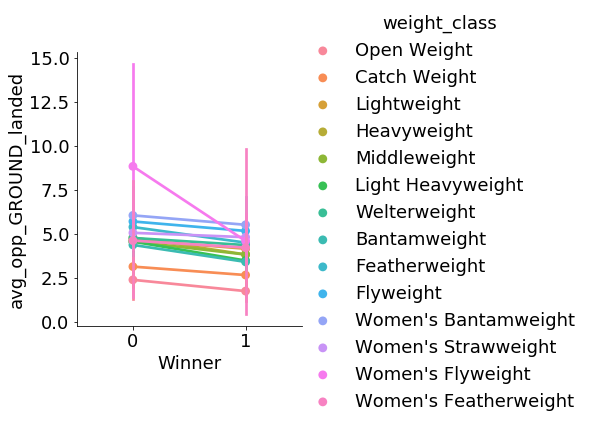

<Figure size 2160x936 with 0 Axes>

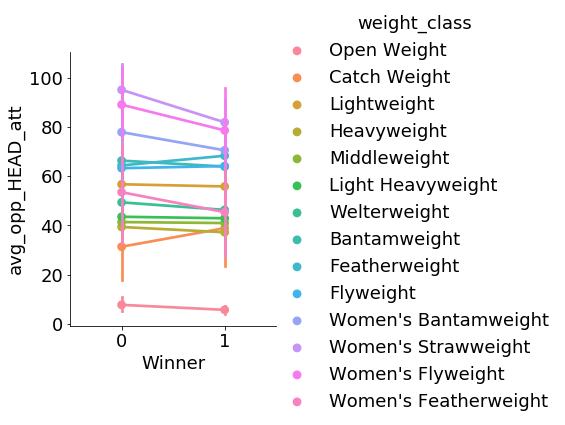

<Figure size 2160x936 with 0 Axes>

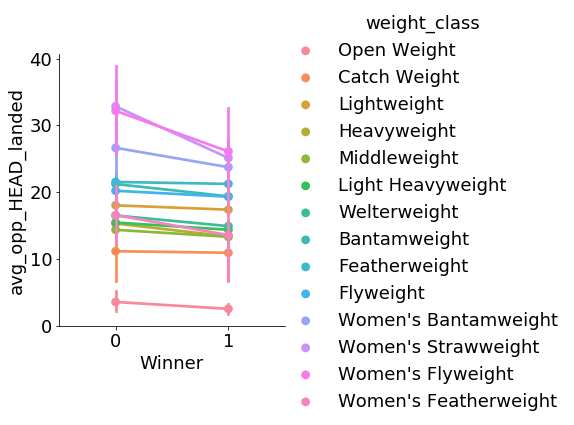

<Figure size 2160x936 with 0 Axes>

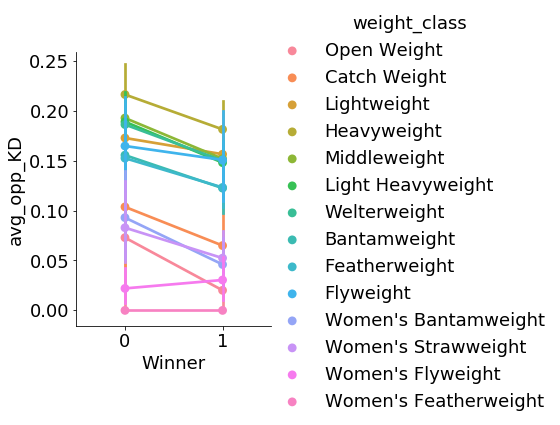

<Figure size 2160x936 with 0 Axes>

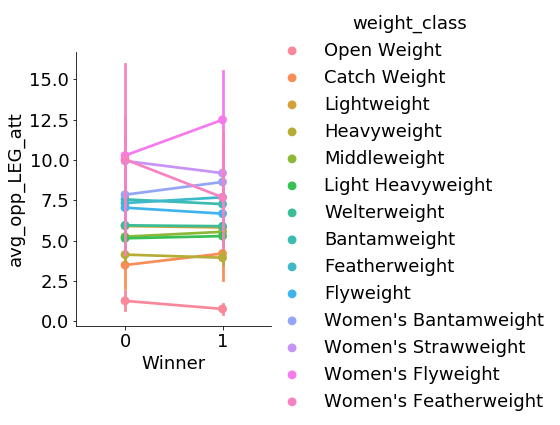

<Figure size 2160x936 with 0 Axes>

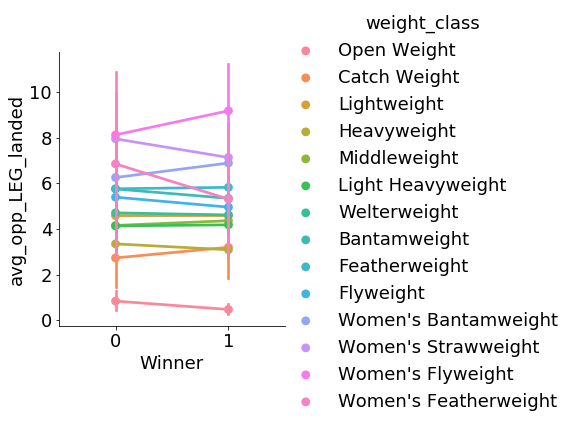

<Figure size 2160x936 with 0 Axes>

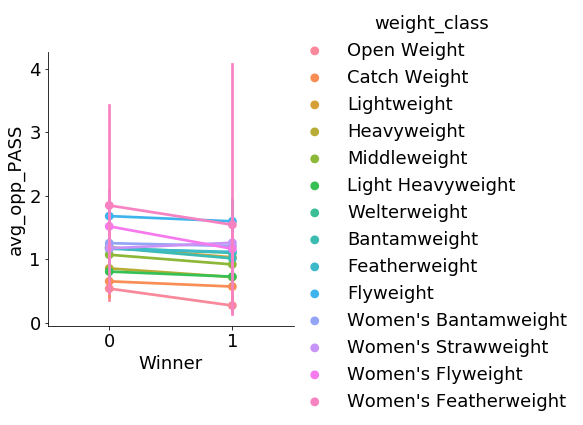

<Figure size 2160x936 with 0 Axes>

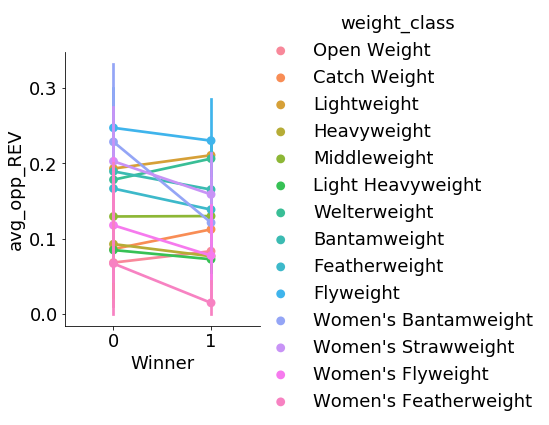

<Figure size 2160x936 with 0 Axes>

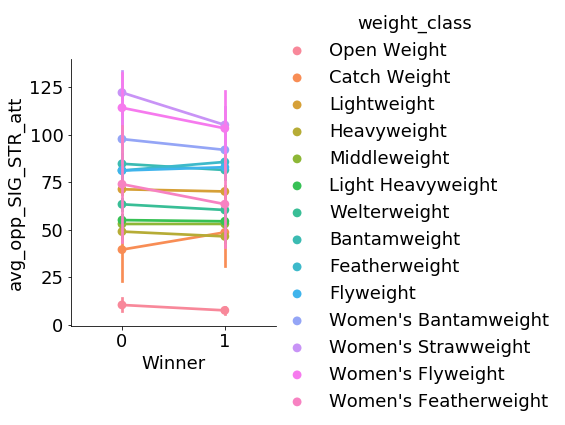

<Figure size 2160x936 with 0 Axes>

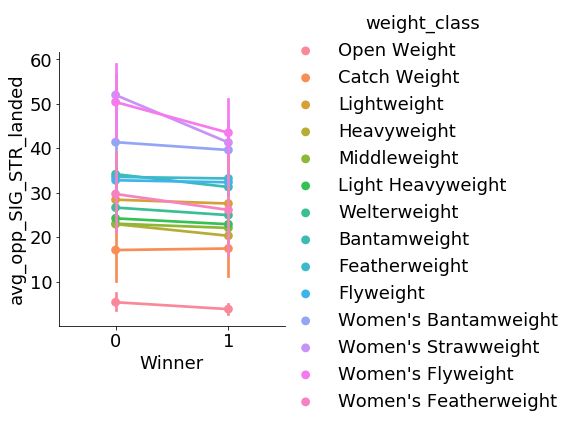

<Figure size 2160x936 with 0 Axes>

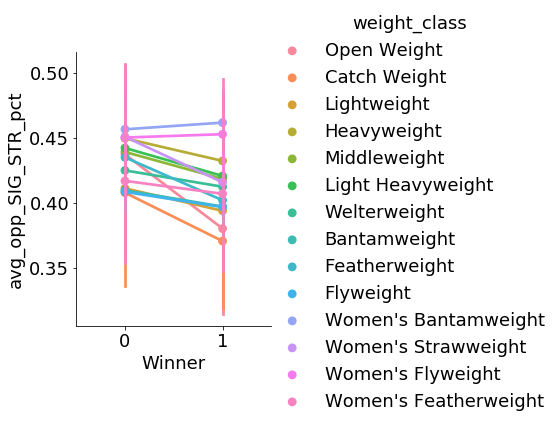

<Figure size 2160x936 with 0 Axes>

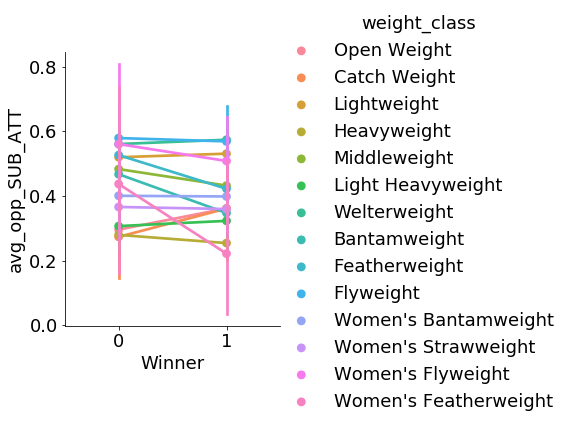

<Figure size 2160x936 with 0 Axes>

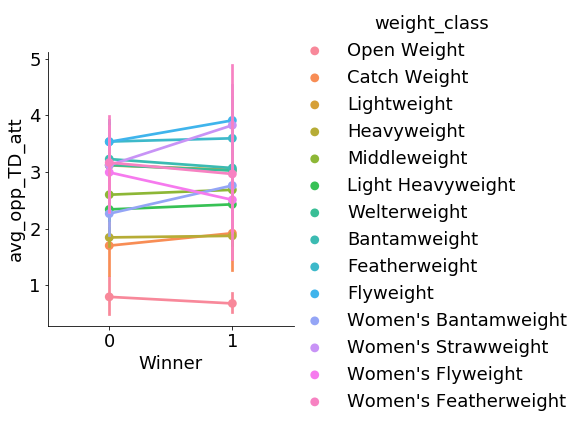

<Figure size 2160x936 with 0 Axes>

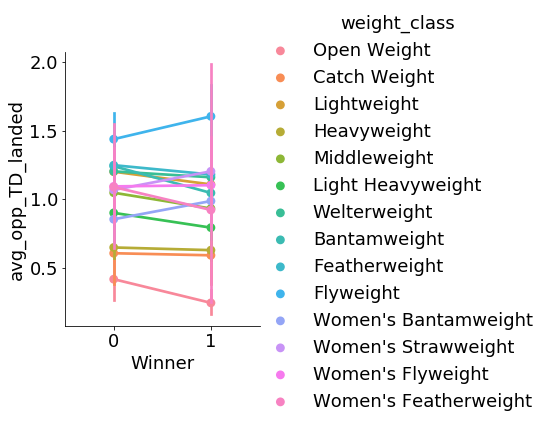

<Figure size 2160x936 with 0 Axes>

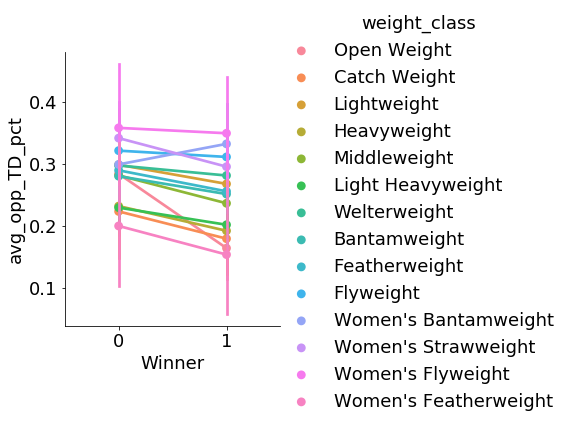

<Figure size 2160x936 with 0 Axes>

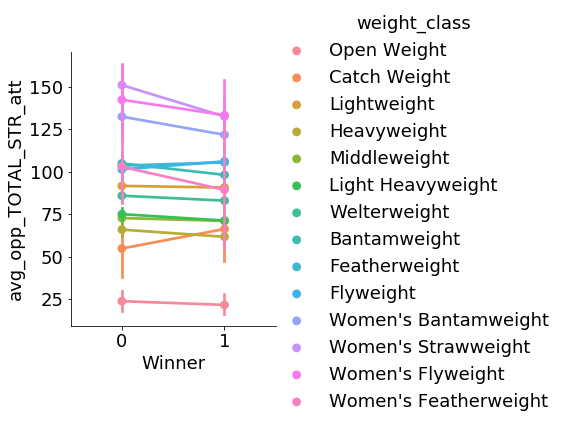

<Figure size 2160x936 with 0 Axes>

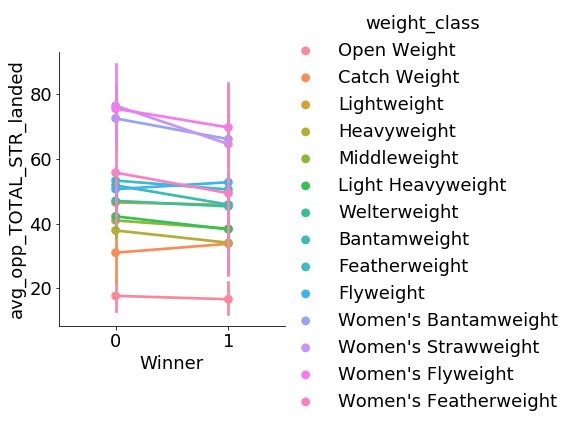

<Figure size 2160x936 with 0 Axes>

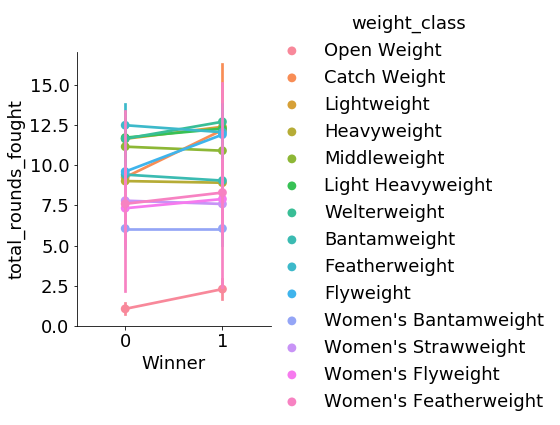

<Figure size 2160x936 with 0 Axes>

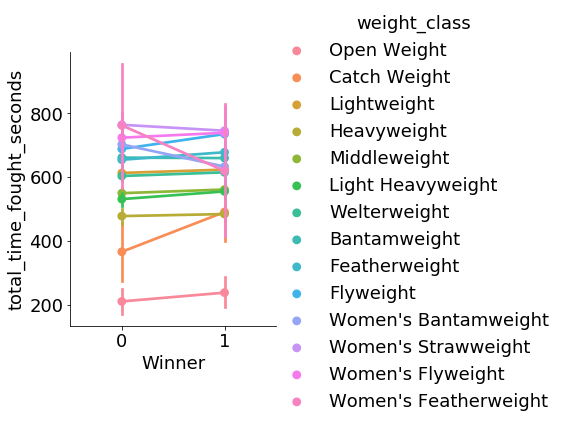

<Figure size 2160x936 with 0 Axes>

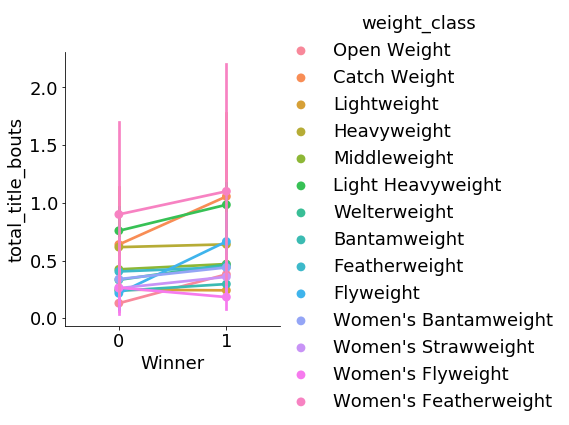

<Figure size 2160x936 with 0 Axes>

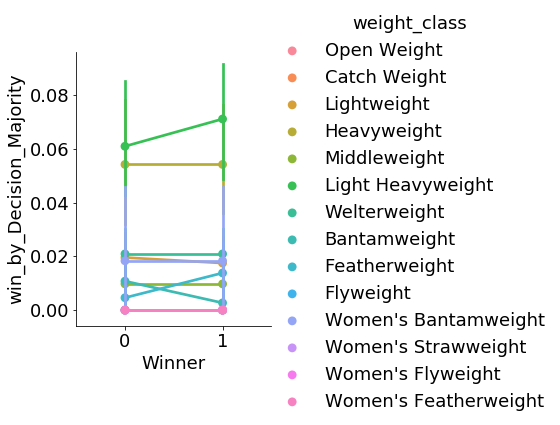

<Figure size 2160x936 with 0 Axes>

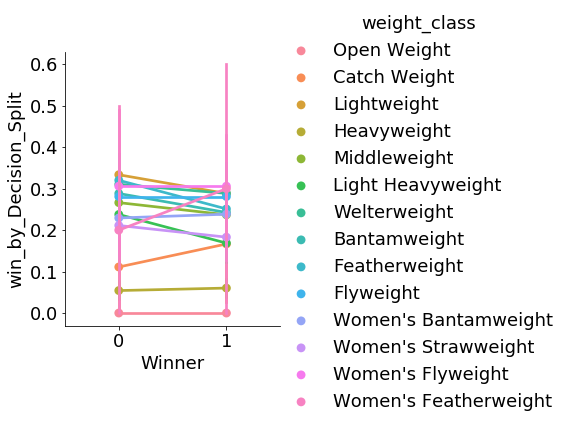

<Figure size 2160x936 with 0 Axes>

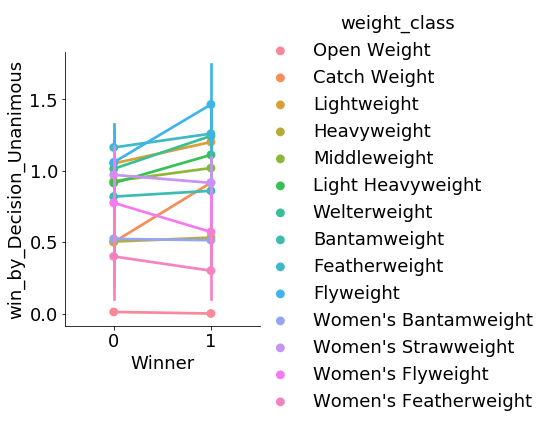

<Figure size 2160x936 with 0 Axes>

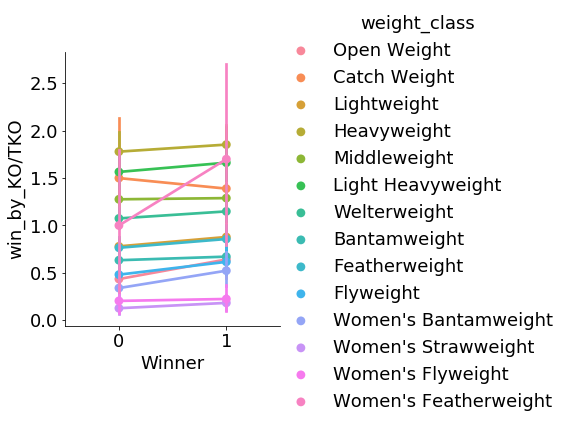

<Figure size 2160x936 with 0 Axes>

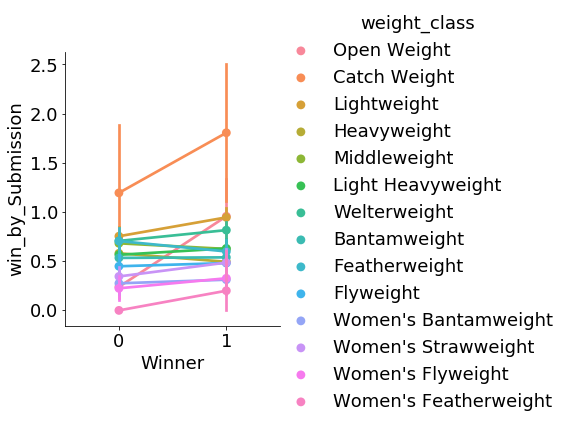

<Figure size 2160x936 with 0 Axes>

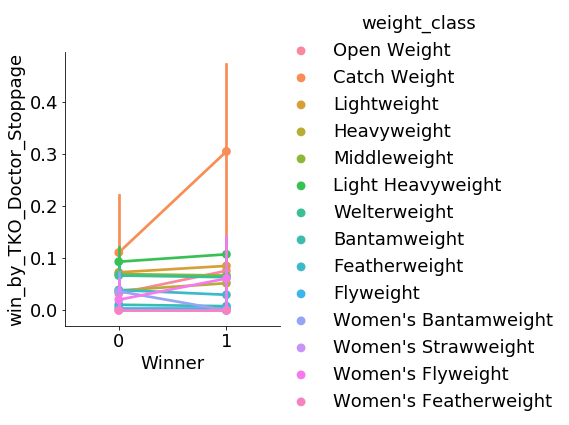

<Figure size 2160x936 with 0 Axes>

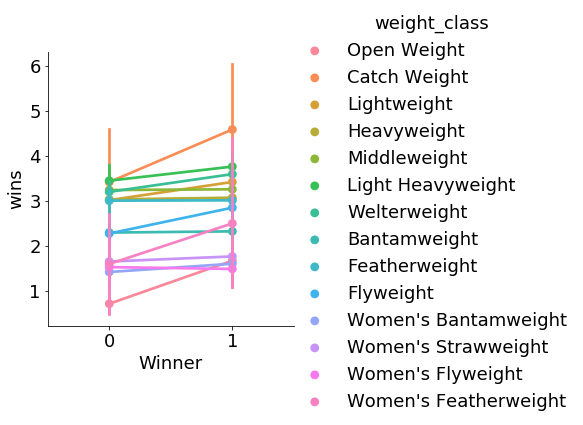

<Figure size 2160x936 with 0 Axes>

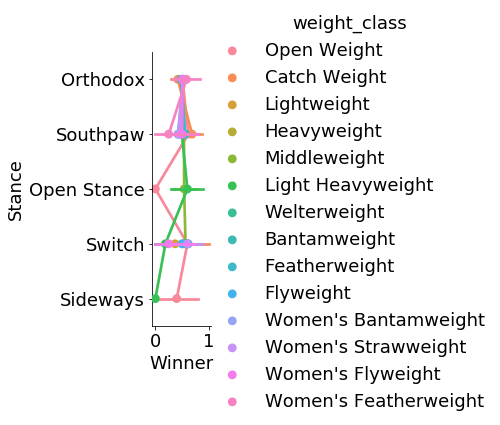

<Figure size 2160x936 with 0 Axes>

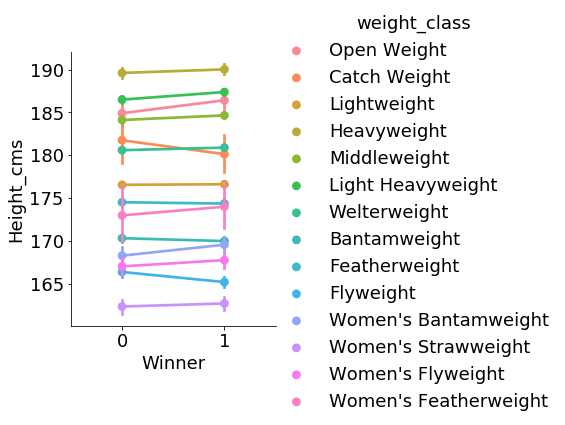

<Figure size 2160x936 with 0 Axes>

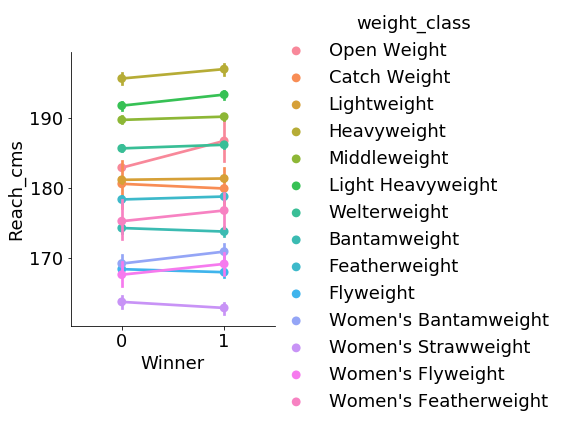

<Figure size 2160x936 with 0 Axes>

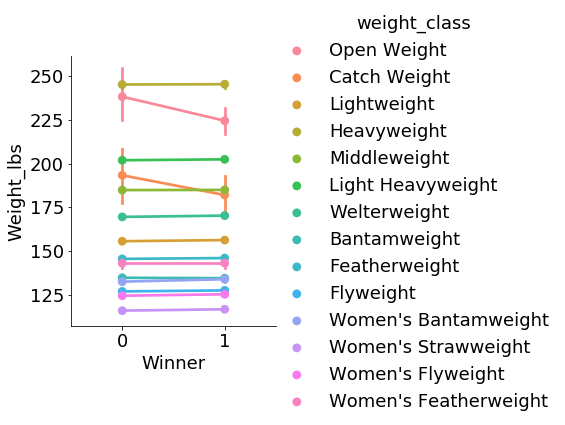

<Figure size 2160x936 with 0 Axes>

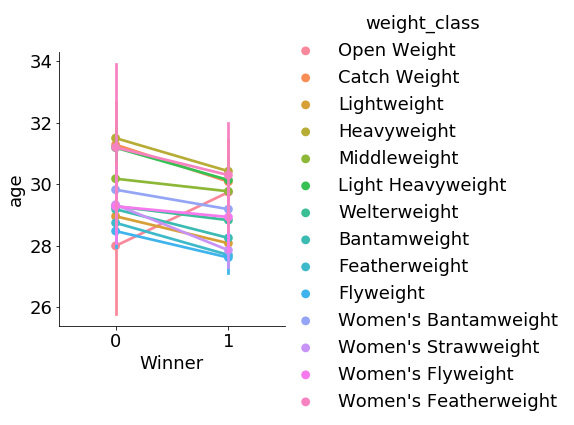

<Figure size 2160x936 with 0 Axes>

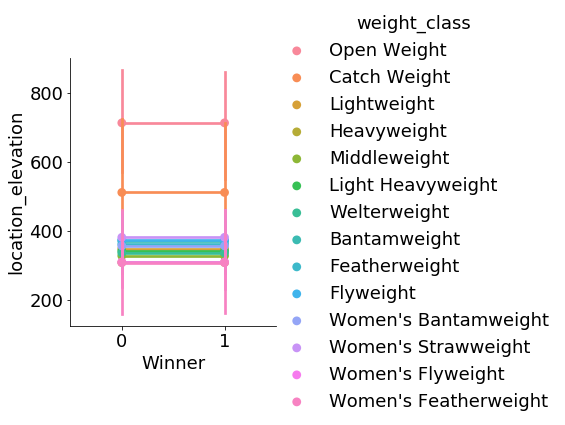

<Figure size 2160x936 with 0 Axes>

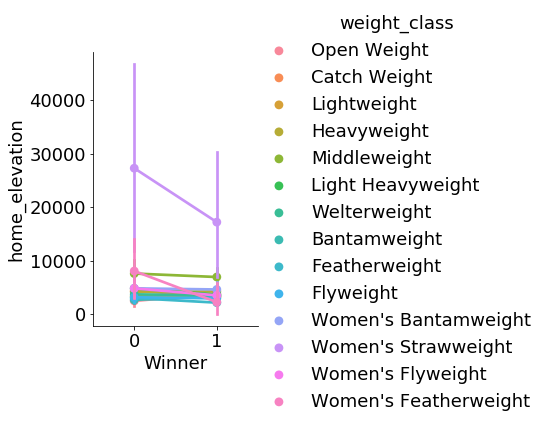

<Figure size 2160x936 with 0 Axes>

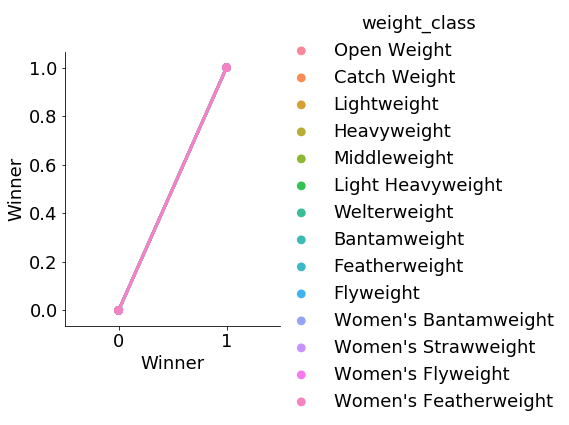

In [13]:
def inspect_data_wc(df, kind, columns):
    for column in columns:
        try:
            fig = plt.figure(figsize=(30, 13))
            sns.catplot(x='Winner', y=column, data=df, kind=kind, hue='weight_class');
            plt.show()
        except:
            pass

#Inspect data for age, height, reach categorical features with weight_class as hue
kinds = ['box', 'point']
columns = ['age', 'Height_cms', 'Reach_cms', 'current_win_streak', 'current_lose_strak', 'total_rounds_fought']
df = data.drop(columns=['fighter', 'city', 'country'])
for kind in kinds:
    inspect_data_wc(df, kind, df.columns)